# 준비

In [4]:
!pip install pydicom
!pip install pydicom transformers torch torchvision clip-by-openai
!pip install git+https://github.com/openai/CLIP.git
!pip install torch torchvision torchaudio
!pip install transformers
!apt update
!apt install -y libgl1-mesa-glx
!pip install scikit-image

  Using cached pydicom-3.0.1-py3-none-any.whl.metadata (9.4 kB)
Using cached pydicom-3.0.1-py3-none-any.whl (2.4 MB)
  Using cached transformers-4.49.0-py3-none-any.whl.metadata (44 kB)
  Using cached clip_by_openai-1.1-py3-none-any.whl.metadata (369 bytes)
  Using cached huggingface_hub-0.29.1-py3-none-any.whl.metadata (13 kB)
  Using cached regex-2024.11.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (40 kB)
  Using cached tokenizers-0.21.0-cp39-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.7 kB)
  Using cached safetensors-0.5.3-cp38-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.8 kB)
  Using cached ftfy-6.3.1-py3-none-any.whl.metadata (7.3 kB)
INFO: pip is looking at multiple versions of clip-by-openai to determine which version is compatible with other requirements. This could take a while.
  Using cached clip_by_openai-1.0.1-py3-none-any.whl.metadata (407 bytes)
  Using cached clip_by_openai-0.1.1.5-py3-none-any.whl.metada

In [5]:
# IMA이미지를 불러오는 라이브러리
import pydicom

import numpy as np
import torch
import torchvision.transforms as transforms
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = [3.0, 3.0]
import seaborn as sns

In [6]:
import glob

L_list = glob.glob('/root/mayo2016/*')
L_list = [path.split('/')[-1] for path in L_list]
L_list = [path for path in L_list if 'L' in path]
L_list.sort()
L_list

['L067',
 'L096',
 'L109',
 'L143',
 'L192',
 'L286',
 'L291',
 'L310',
 'L333',
 'L506']

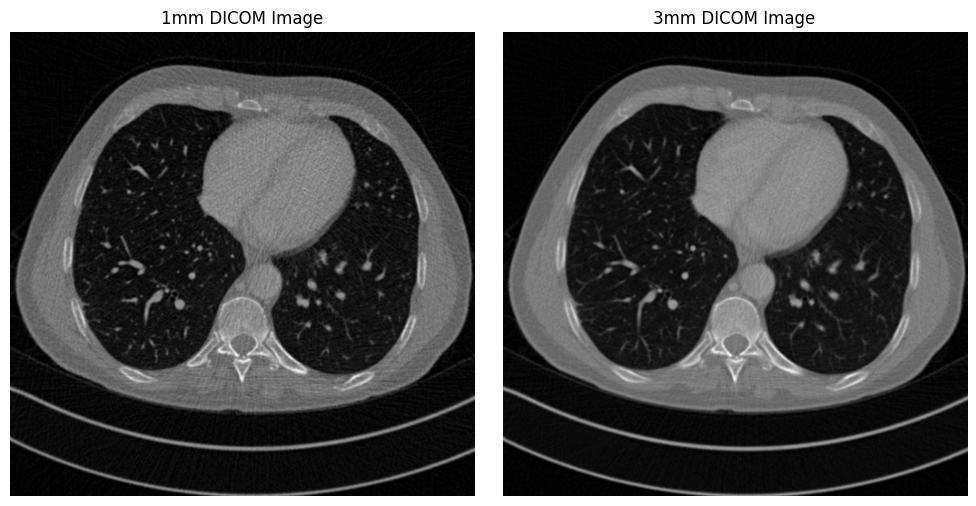

In [7]:
import pydicom
import numpy as np
import matplotlib.pyplot as plt
import glob

# L_list에서 첫 번째 값 가져오기
L = L_list[0]

# 1mm 및 3mm DICOM 파일 경로 설정
path1mm = sorted(glob.glob(f'/root/mayo2016/{L}/quarter_1mm/*.IMA'))[0]
path3mm = sorted(glob.glob(f'/root/mayo2016/{L}/quarter_3mm/*.IMA'))[0]

# DICOM 파일 읽기
dicom_data_1mm = pydicom.dcmread(path1mm)
dicom_data_3mm = pydicom.dcmread(path3mm)

# 픽셀 데이터 추출 및 정규화
img1mm = dicom_data_1mm.pixel_array.astype(np.float32)
img3mm = dicom_data_3mm.pixel_array.astype(np.float32)

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(img1mm, cmap='gray')
axes[0].set_title('1mm DICOM Image')
axes[0].axis('off')

axes[1].imshow(img3mm, cmap='gray')
axes[1].set_title('3mm DICOM Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()


📌 결론: 1mm vs. 3mm, 어떤 것이 더 적합할까?

✅ 1mm 데이터를 추천

목적이 정밀한 디노이징 및 세그멘테이션을 위한 모델 개발이라면, 1mm를 선택하는 것이 좋음
노이즈가 많지만, 실제 저선량 CT에서 발생하는 복원 문제를 더 잘 반영할 수 있음
다만, 1mm는 더 어려운 문제이므로 데이터 증강이나 추가적인 노이즈 제거 기법을 고려하는 것이 필요

✅ 3mm는 빠르고 안정적인 학습이 필요할 때 사용 가능

초기 실험에서는 3mm로 시작하여 모델의 기본적인 성능을 확인하고, 이후 1mm 데이터로 파인튜닝하는 전략도 가능

In [8]:
# 1mm 사용함

data_label = ['quarter_1mm', 'full_1mm']

In [ ]:
# # X,y의 순서쌍 갯수가 일치한다.

# for L in L_list:
#   n1 = len(sorted(glob.glob(f'/root/mayo2016/{L}/{data_label[0]}/*.IMA')))
#   n2 = len(sorted(glob.glob(f'/root/mayo2016/{L}/{data_label[0]}/*.IMA')))
#   notation = ''
#   if n1 != n2:
#     notation = '<-'
#   print(f"{L} : {n1}, {n2} {notation}")

In [ ]:
# # 모든 이미지가 512x512 사이즈이다.

# for L in L_list:
#   for label in data_label:
#     path_list = sorted(glob.glob(f'/root/mayo2016/{L}/{label}/*.IMA'))
#     for file_path in path_list:
#         dicom_data = pydicom.dcmread(file_path)
#         img = dicom_data.pixel_array
#         assert img.shape == (512, 512)

# 전처리

## 1. 부위 종류 확인

### 시각화

In [9]:
import os
import pydicom
import numpy as np
import torch
import clip
from torchvision import transforms
from PIL import Image

# 이미지 불러오기
def load_dicom_image(dicom_path):
    dicom_data = pydicom.dcmread(dicom_path)
    img = dicom_data.pixel_array.astype(np.float32)

    # 정규화 (0~1 사이로)
    img = (img - img.min()) / (img.max() - img.min())
    img = (img * 255).astype(np.uint8)

    return Image.fromarray(img)

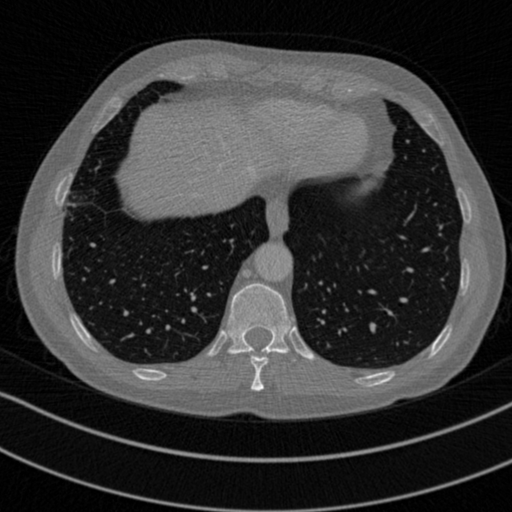

In [10]:
# Mayo 2016 데이터셋에서 DICOM 파일 찾기
base_folder = "/root/mayo2016"
img_type = "quarter_1mm"
dicom_files = []

# 모든 L0xx 폴더에서 DICOM 파일 수집
L_patients = L_list
for patient_id in L_patients:
    patient_folder = os.path.join(base_folder, patient_id, "quarter_1mm") # quarter_1mm
    if os.path.exists(patient_folder):
        patient_files = [os.path.join(patient_folder, f) 
                        for f in os.listdir(patient_folder) 
                        if f.endswith(".IMA")]
        dicom_files.extend(patient_files)

# 첫 번째 DICOM 이미지를 로드
dicom_img = load_dicom_image(dicom_files[0])
dicom_img.show()  # 시각화

### clip 사용하기

In [10]:
import clip
import torch

# PubMedCLIP 모델 불러오기
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

print("CLIP 모델 로드 성공!")

CLIP 모델 로드 성공!


In [11]:
import clip
from transformers import CLIPProcessor, CLIPModel

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)  # 일반 CLIP 모델 사용 (PubMedCLIP 버전이 필요하면 따로 다운로드)

# 이미지 변환
image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)

# 장기 검색을 위한 텍스트
text_descriptions = [
    "brain",          # 뇌
    "lungs",          # 폐
    "liver",          # 간
    "stomach",        # 위
    "kidneys",        # 신장
    "pancreas",       # 췌장
    "spleen",         # 비장
    "heart",          # 심장
    "chest",          # 가슴 (흉부)
    "abdomen",        # 복부
    "pelvis",         # 골반
    "spine",          # 척추
    "ribs",           # 갈비뼈
    "bladder",        # 방광
    "prostate",       # 전립선 (남성)
    "uterus",         # 자궁 (여성)
    "adrenal glands", # 부신
    "thyroid",        # 갑상선
    "esophagus",      # 식도
    "intestines"      # 장
]
text_tokens = clip.tokenize(text_descriptions).to(device)

# 이미지 & 텍스트 인코딩
with torch.no_grad():
    image_features = model.encode_image(image_tensor)
    text_features = model.encode_text(text_tokens)

# 코사인 유사도 계산
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarities = (image_features @ text_features.T).squeeze(0)

# 가장 유사한 장기 출력
best_match_idx = similarities.argmax().item()
print(f"Detected Organ: {text_descriptions[best_match_idx]}")

Detected Organ: lungs


In [12]:
from collections import defaultdict

# 장기별 인덱스 저장을 위한 딕셔너리 초기화
organ_indices = defaultdict(list)  # 또는 {organ: [] for organ in text_descriptions}

for idx, dicom_path in enumerate(dicom_files):  # enumerate로 인덱스 추적
    dicom_img = load_dicom_image(dicom_path)
    image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)

    with torch.no_grad():
        image_features = model.encode_image(image_tensor)
        similarities = (image_features @ text_features.T).squeeze(0)

    best_match_idx = similarities.argmax().item()
    detected_organ = text_descriptions[best_match_idx]
    
    organ_indices[detected_organ].append(idx)  # 현재 파일의 인덱스 저장

# 결과 출력 (카운트 + 인덱스 리스트)
print("Organ counts in Mayo2016 dataset:")
for organ, indices in organ_indices.items():
    print(f"{organ}: {len(indices)}")

Organ counts in Mayo2016 dataset:
lungs: 895
uterus: 407
esophagus: 737
pancreas: 3152
pelvis: 164
kidneys: 89
adrenal glands: 447
spleen: 30
prostate: 1
bladder: 10
thyroid: 4


In [13]:
# 특이 케이스 시각화 예시 (예: 자궁으로 분류된 첫 번째 이미지)

def drawing(anomaly_organ, idx, organ_indices=organ_indices):
    if anomaly_organ in organ_indices:
        sample_idx = organ_indices[anomaly_organ][idx]
        sample_path = dicom_files[sample_idx]
        
        import matplotlib.pyplot as plt
        dicom_img = load_dicom_image(sample_path)
        plt.imshow(dicom_img, cmap='gray')
        plt.title(f"Detected: {anomaly_organ}")
        plt.show()
    else:
        print(f"No cases detected for {anomaly_organ}.")

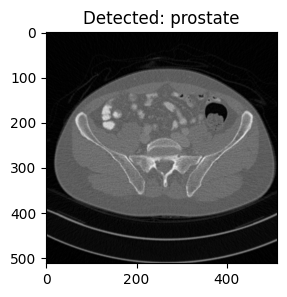

In [14]:
anomaly_organ = "prostate"
idx = 0

drawing(anomaly_organ, idx, organ_indices)

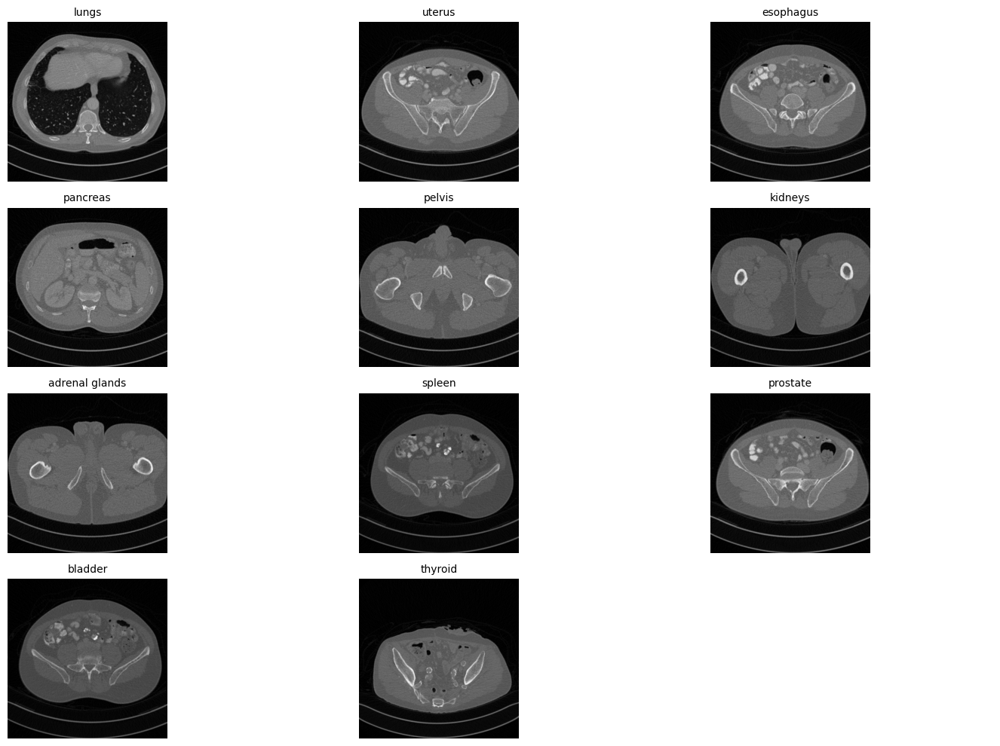

In [15]:
import matplotlib.pyplot as plt
import math

# 분류된 장기 중 1개 이상 존재하는 것만 필터링
detected_organs = [organ for organ, indices in organ_indices.items() if len(indices) >= 1]

# 서브플롯 레이아웃 계산
num_organs = len(detected_organs)
rows = math.ceil(math.sqrt(num_organs))  # 제곱근 기반 행 계산
cols = math.ceil(num_organs / rows)      # 열 계산

# Figure 생성
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
if rows == 1 or cols == 1:
    axes = axes.reshape(-1)  # 1차원 배열로 변환

# 각 장기의 첫 번째 이미지 시각화
for ax, organ in zip(axes.flat, detected_organs):
    try:
        first_idx = organ_indices[organ][0]
        dicom_path = dicom_files[first_idx]
        dicom_img = load_dicom_image(dicom_path)
        
        ax.imshow(dicom_img, cmap='gray')
        ax.set_title(f"{organ}", fontsize=10)
        ax.axis('off')
    except IndexError:
        ax.axis('off')  # 오류 발생 시 축 숨기기
        continue

# 남은 빈 서브플롯 축 숨기기
for ax in axes.flat[num_organs:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

### pubmedclip 사용하기

In [16]:
!pip install torch torchvision transformers open_clip_torch

  Using cached open_clip_torch-2.31.0-py3-none-any.whl.metadata (31 kB)
  Using cached timm-1.0.15-py3-none-any.whl.metadata (52 kB)
Using cached open_clip_torch-2.31.0-py3-none-any.whl (1.5 MB)
Using cached timm-1.0.15-py3-none-any.whl (2.4 MB)


In [17]:
import torch
from PIL import Image
from urllib.request import urlopen
from open_clip import create_model_from_pretrained, get_tokenizer

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# 예제 이미지 및 텍스트
image_url = 'https://huggingface.co/microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224/resolve/main/example_data/biomed_image_classification_example_data/squamous_cell_carcinoma_histopathology.jpeg'
image = Image.open(urlopen(image_url))
texts = ['adenocarcinoma histopathology', 'squamous cell carcinoma histopathology']

# 이미지 및 텍스트 전처리
image_input = preprocess(image).unsqueeze(0).to(device)
text_input = tokenizer(texts).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = model(image_input, text_input)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(texts):
    print(f'{text}: {logits[0][i].item():.4f}')

adenocarcinoma histopathology: 0.0029
squamous cell carcinoma histopathology: 0.9971


In [18]:
# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# 사용할 이미지
idx = 10
dicom_img = load_dicom_image(dicom_files[idx])
image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)

# 장기 검색을 위한 텍스트
text_descriptions = [
    "brain",          # 뇌
    "lungs",          # 폐
    "liver",          # 간
    "stomach",        # 위
    "kidneys",        # 신장
    "pancreas",       # 췌장
    "spleen",         # 비장
    "heart",          # 심장
    "chest",          # 가슴 (흉부)
    "abdomen",        # 복부
    "pelvis",         # 골반
    "spine",          # 척추
    "ribs",           # 갈비뼈
    "bladder",        # 방광
    "prostate",       # 전립선 (남성)
    "uterus",         # 자궁 (여성)
    "adrenal glands", # 부신
    "thyroid",        # 갑상선
    "esophagus",      # 식도
    "intestines"      # 장
]
text_tokens = tokenizer(text_descriptions).to(device)

# 예측 수행
with torch.no_grad():
    image_features, text_features, logit_scale = model(image_tensor, text_tokens)
    logits = (logit_scale * image_features @ text_features.T).softmax(dim=-1)

# 결과 출력
for i, text in enumerate(text_descriptions):
    print(f'{text}: {logits[0][i].item():.4f}')

brain: 0.0000
lungs: 0.0000
liver: 0.0000
stomach: 0.0000
kidneys: 0.0000
pancreas: 0.0000
spleen: 0.0000
heart: 0.0000
chest: 0.0000
abdomen: 0.0000
pelvis: 0.9843
spine: 0.0000
ribs: 0.0000
bladder: 0.0000
prostate: 0.0156
uterus: 0.0000
adrenal glands: 0.0000
thyroid: 0.0000
esophagus: 0.0000
intestines: 0.0000


Detected Organ: pelvis


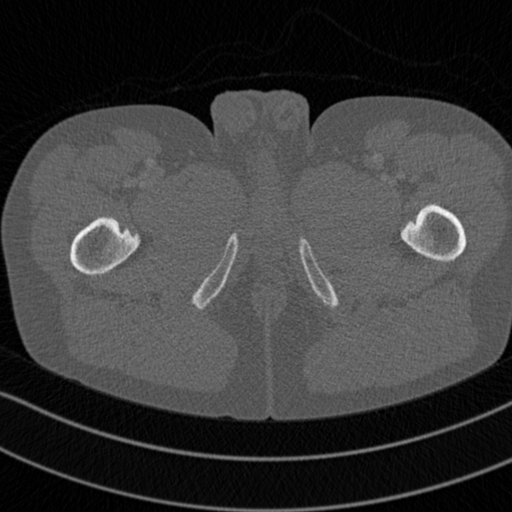

In [19]:
# 코사인 유사도 계산
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarities = (image_features @ text_features.T).squeeze(0)

# 가장 유사한 장기 출력
best_match_idx = similarities.argmax().item()
print(f"Detected Organ: {text_descriptions[best_match_idx]}")

dicom_img.show()

In [20]:
from collections import defaultdict

# 장기별 인덱스 저장을 위한 딕셔너리 초기화
organ_indices = defaultdict(list)  # 또는 {organ: [] for organ in text_descriptions}

for idx, dicom_path in enumerate(dicom_files):  # enumerate로 인덱스 추적
    dicom_img = load_dicom_image(dicom_path)
    image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)

    with torch.no_grad():
        image_features = model.encode_image(image_tensor)
        similarities = (image_features @ text_features.T).squeeze(0)

    best_match_idx = similarities.argmax().item()
    detected_organ = text_descriptions[best_match_idx]
    
    organ_indices[detected_organ].append(idx)  # 현재 파일의 인덱스 저장

# 결과 출력 (카운트 + 인덱스 리스트)
print("Organ counts in Mayo2016 dataset:")
for organ, indices in organ_indices.items():
    print(f"{organ}: {len(indices)}")

Organ counts in Mayo2016 dataset:
lungs: 1099
pelvis: 2531
pancreas: 269
prostate: 50
kidneys: 148
spleen: 1004
abdomen: 318
spine: 260
bladder: 37
liver: 58
chest: 112
thyroid: 41
intestines: 5
stomach: 2
adrenal glands: 2


In [21]:
# 시각화 함수

def drawing(anomaly_organ, idx, organ_indices=organ_indices):
    if anomaly_organ in organ_indices:
        sample_idx = organ_indices[anomaly_organ][idx]
        sample_path = dicom_files[sample_idx]
        
        import matplotlib.pyplot as plt
        dicom_img = load_dicom_image(sample_path)
        plt.imshow(dicom_img, cmap='gray')
        plt.title(f"Detected: {anomaly_organ}")
        plt.show()
    else:
        print(f"No cases detected for {anomaly_organ}.")

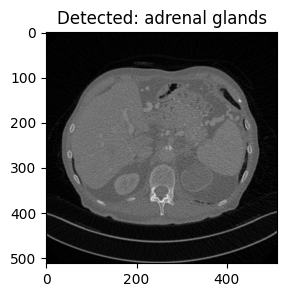

In [22]:
anomaly_organ = "adrenal glands"
idx = 0

drawing(anomaly_organ, idx, organ_indices)

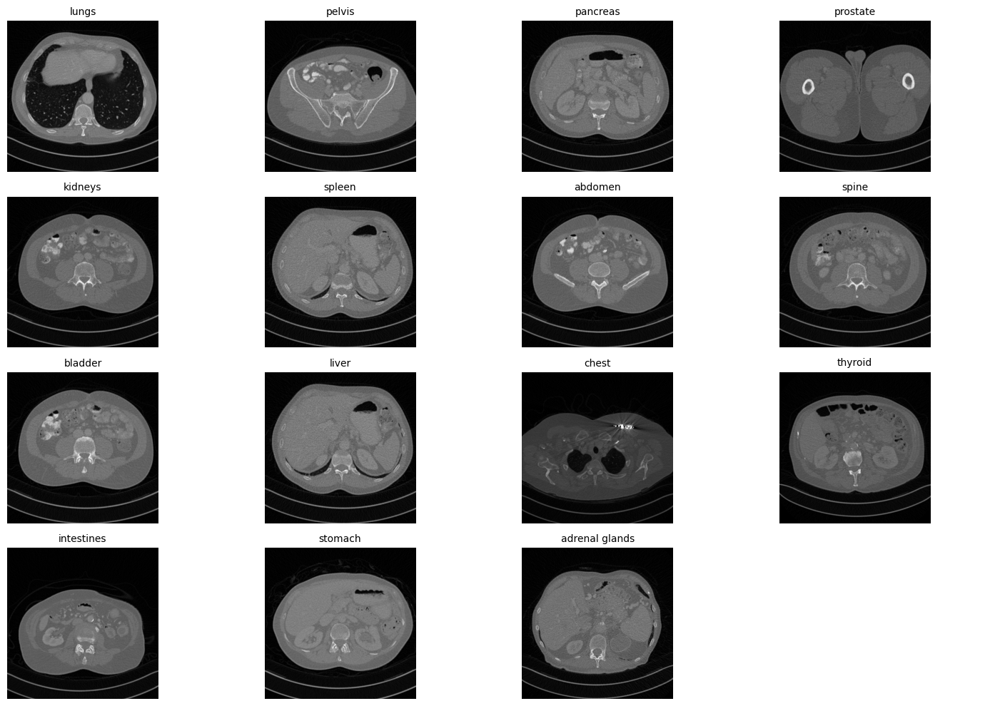

In [23]:
import matplotlib.pyplot as plt
import math

# 분류된 장기 중 1개 이상 존재하는 것만 필터링
detected_organs = [organ for organ, indices in organ_indices.items() if len(indices) >= 1]

# 서브플롯 레이아웃 계산
num_organs = len(detected_organs)
rows = math.ceil(math.sqrt(num_organs))  # 제곱근 기반 행 계산
cols = math.ceil(num_organs / rows)      # 열 계산

# Figure 생성
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
if rows == 1 or cols == 1:
    axes = axes.reshape(-1)  # 1차원 배열로 변환

# 각 장기의 첫 번째 이미지 시각화
for ax, organ in zip(axes.flat, detected_organs):
    try:
        first_idx = organ_indices[organ][0]
        dicom_path = dicom_files[first_idx]
        dicom_img = load_dicom_image(dicom_path)
        
        ax.imshow(dicom_img, cmap='gray')
        ax.set_title(f"{organ}", fontsize=10)
        ax.axis('off')
    except IndexError:
        ax.axis('off')  # 오류 발생 시 축 숨기기
        continue

# 남은 빈 서브플롯 축 숨기기
for ax in axes.flat[num_organs:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

## 2. 유사한걸로 클러스터링 하기

In [24]:
import pandas as pd
from tqdm import tqdm  # 진행 상황 표시
from collections import defaultdict

# 저장할 리스트 초기화
dicom_locations = []
top10_organ_lists = []

# 모델 및 전처리기 로드
model_name = 'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
model, preprocess = create_model_from_pretrained(model_name)
tokenizer = get_tokenizer(model_name)

# 모델을 평가 모드로 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

CustomTextCLIP(
  (visual): TimmModel(
    (trunk): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=768, out_features=768, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): Identity()
          (drop_path1): Identity()
          (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=768

In [25]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram, linkage
from tqdm import tqdm
from collections import defaultdict

In [26]:
# 클러스터링 함수 정의
def cluster_ct_images(dicom_files, text_tokens, text_descriptions, num_clusters=3, method="PCA"):
    """CT 이미지를 PubMedCLIP으로 벡터화하고 클러스터링 수행"""
    
    image_vectors = []
    dicom_locations = []

    # tqdm을 사용하여 진행 상황 표시
    for dicom_path in tqdm(dicom_files, desc="Processing DICOM Files"):
        dicom_img = load_dicom_image(dicom_path)
        image_tensor = preprocess(dicom_img).unsqueeze(0).to(device)
        # PubMedCLIP 예측수행
        with torch.no_grad():
            image_features, text_features, logit_scale = model(image_tensor, text_tokens)
        # 코사인 유사도 계산
        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        similarities = (image_features @ text_features.T).squeeze(0).cpu().numpy()
        # 벡터 저장
        image_vectors.append(similarities)
        dicom_locations.append(dicom_path)
    
    # NumPy 배열로 변환
    image_vectors = np.array(image_vectors)

    # 차원 축소 (PCA / t-SNE)
    if method == "PCA":
        reduced_vectors = PCA(n_components=2).fit_transform(image_vectors)
    elif method == "t-SNE":
        reduced_vectors = TSNE(n_components=2, perplexity=10, random_state=42).fit_transform(image_vectors)
    else:
        reduced_vectors = image_vectors  # Hierarchical Clustering은 차원 축소 없이 사용 가능

    # 클러스터링 수행
    if method in ["PCA", "t-SNE"]:
        clustering = KMeans(n_clusters=num_clusters, random_state=42).fit(reduced_vectors)
        labels = clustering.labels_
    elif method == "Hierarchical":
        clustering = AgglomerativeClustering(n_clusters=num_clusters).fit(image_vectors)
        labels = clustering.labels_
 
 # 결과 시각화
    plt.figure(figsize=(8, 6))
    if method in ["PCA", "t-SNE"]:
        sns.scatterplot(x=reduced_vectors[:, 0], y=reduced_vectors[:, 1], hue=labels, palette="Set2", s=100)
        plt.xlabel(f"{method} Component 1")
        plt.ylabel(f"{method} Component 2")
        plt.title(f"CT Image Clustering using {method}")
    elif method == "Hierarchical":
        Z = linkage(image_vectors, method='ward')
        dendrogram(Z)
        plt.title("Hierarchical Clustering Dendrogram")

    plt.show()

    # DataFrame 생성
    df = pd.DataFrame({
        "DICOM Location": dicom_locations,
        "Cluster Label": labels
    })
    return df

Processing DICOM Files: 100%|██████████| 5936/5936 [06:44<00:00, 14.68it/s]


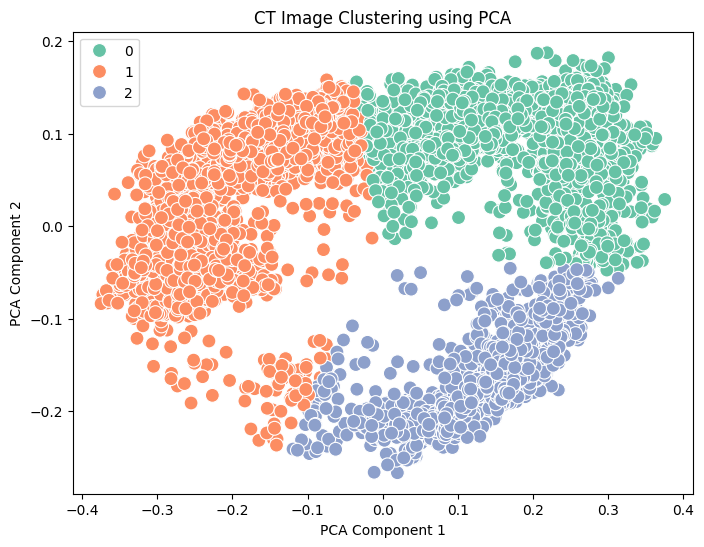

,DICOM Location,Cluster Label
0,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,2
1,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,1
2,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,1
3,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,1
4,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,2


In [27]:
# 실행 예제
num_clusters = 3
method = "PCA"  # "PCA", "t-SNE", "Hierarchical" 중 선택
text_descriptions = [
    "brain",          # 뇌
    "lungs",          # 폐
    "liver",          # 간
    "stomach",        # 위
    "kidneys",        # 신장
    "pancreas",       # 췌장
    "spleen",         # 비장
    "heart",          # 심장
    "chest",          # 가슴 (흉부)
    "abdomen",        # 복부
    "pelvis",         # 골반
    "spine",          # 척추
    "ribs",           # 갈비뼈
    "bladder",        # 방광
    "prostate",       # 전립선 (남성)
    "uterus",         # 자궁 (여성)
    "adrenal glands", # 부신
    "thyroid",        # 갑상선
    "esophagus",      # 식도
    "intestines"      # 장
]
text_tokens = tokenizer(text_descriptions).to(device)

df_clusters = cluster_ct_images(dicom_files, text_tokens, text_descriptions, num_clusters, method)
df_clusters.head()

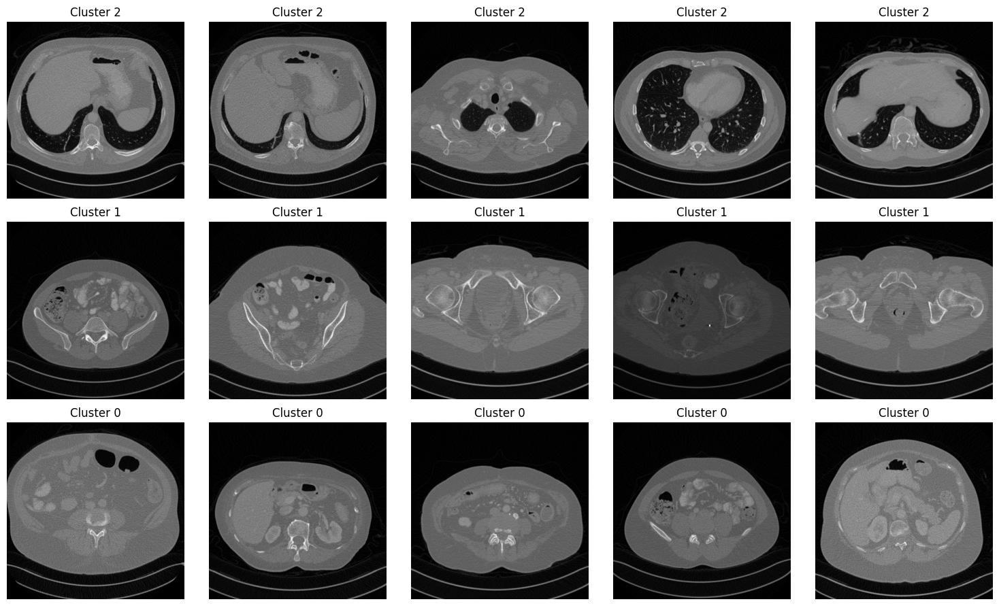

In [28]:
import matplotlib.pyplot as plt
import random

# 클러스터 ID 리스트
cluster_ids = df_clusters["Cluster Label"].unique()

# 3행 5열의 서브플롯 생성
fig, axes = plt.subplots(3, 5, figsize=(15, 9))

for i, cluster_id in enumerate(cluster_ids[:3]):  # 최대 3개 클러스터만 시각화
    # 해당 클러스터의 샘플 5개 선택
    cluster_samples = df_clusters[df_clusters["Cluster Label"] == cluster_id]["DICOM Location"].sample(5, random_state=42)
    
    for j, dicom_path in enumerate(cluster_samples):
        img = load_dicom_image(dicom_path)  # DICOM 이미지를 로드하는 함수

        ax = axes[i, j]
        ax.imshow(img, cmap="gray")
        ax.set_title(f"Cluster {cluster_id}")
        ax.axis("off")

plt.tight_layout()
plt.show()

In [29]:
%cd /root/

/root


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [30]:
df_clusters.to_csv("/root/df_clusters.csv", index=False)

## 3. 욜로월드의 가이드 주기

# 일반 모델 학습

## 함수선언

In [21]:
L_list = glob.glob('/root/mayo2016/*')
L_list = [path.split('/')[-1] for path in L_list]
L_list = [path for path in L_list if 'L' in path]
L_list.sort()

data_label = ['quarter_1mm', 'full_1mm'] # 1mm 사용함

In [22]:
def normlize(dicom_path):
    dicom_data = pydicom.dcmread(dicom_path)
    img = dicom_data.pixel_array.astype(np.float32) * dicom_data.RescaleSlope + dicom_data.RescaleIntercept

    # CT 값 클리핑 (일반적인 HU 범위: -1000~3000) <- 극단적인 값 제거를 위해
    img = np.clip(img, -1000, 3000) # 3000이 넘어가면 3000으로 바꿈

    # 정규화 (0~1 사이로)
    scaled_img = (img - img.min()) / (img.max() - img.min())
    
    # 제일 앞에 1차원 넣기
    img = np.expand_dims(scaled_img, axis=0)

    return img # 1x512x512

In [23]:
# Mayo 2016 데이터셋에서 DICOM 파일 찾기
base_folder = "/root/mayo2016"
img_type = "quarter_1mm"
dicom_files = []

# 모든 L0xx 폴더에서 DICOM 파일 수집
L_patients = L_list
for patient_id in L_patients:
    patient_folder = os.path.join(base_folder, patient_id, "quarter_1mm") # quarter_1mm
    if os.path.exists(patient_folder):
        patient_files = [os.path.join(patient_folder, f) 
                        for f in os.listdir(patient_folder) 
                        if f.endswith(".IMA")]
        dicom_files.extend(patient_files)

In [24]:
img = normlize(dicom_files[0])
img.shape, img.max(), img.min() # 0~1 사이어야 유리하다.

((1, 512, 512), 1.0, 0.0)

In [25]:
def extract_patches(img, patch_size=55, interval=55):
  patches = []
  _, height, width = img.shape
  for y in range(0, height - patch_size + 1, interval):
    for x in range(0, width - patch_size + 1, interval):
      patch = img[:, y:y + patch_size, x:x + patch_size]
      patches.append(patch)
  patches = np.array(patches)
  return patches # patch수x1x55x55

추출된 패치 수: 81
각 패치의 크기: (1, 55, 55)


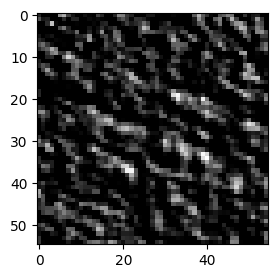

In [26]:
# 1x512x512 이미지에서 1x55x55 패치 추출
patch_size = 55
interval = 55
patches = extract_patches(img, patch_size, interval)

print(f"추출된 패치 수: {len(patches)}")
print(f"각 패치의 크기: {patches[0].shape}")

# 이미지 확인
plt.imshow(np.squeeze(patches[0]), cmap='gray')
plt.show()

In [27]:
from scipy.ndimage import rotate, zoom
import random

def augment_patches(X_patches, y_patches, p=0.5):
    
    X_augmented_patches, y_augmented_patches = [], []
    
    # random이 들어가기에, X랑 y를 동시에 넣어준다.
    for i, (X_patch, y_patch) in enumerate(zip(X_patches, y_patches)):
        # 원본 패치 추가
        X_augmented_patches.append(X_patch)
        y_augmented_patches.append(y_patch)

        if random.random() < p:
            # 1. 90, 270으로 돌려보자.(뒤집기랑 조금 다르긴 하지만, 점대칭 vs 선대칭, 그냥 +-90도만 쓰자.)
            X, y = rotate(X_patch, 90, axes=(1, 2), reshape=False), rotate(y_patch, 90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
            X, y = rotate(X_patch, -90, axes=(1, 2), reshape=False), rotate(y_patch, -90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 2. 수직 뒤집기
            X,y = np.flip(X_patch, axis=1),np.flip(y_patch, axis=1)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 3. 수평 뒤집기
            X,y = np.flip(X_patch, axis=2),np.flip(y_patch, axis=2)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)

    return np.array(X_augmented_patches), np.array(y_augmented_patches)

In [28]:
def patch_maker_W_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  X_augmented_patches, y_augmented_patches = augment_patches(X_patches, y_patches, p=0.5)
  # X_augmented_patches = torch.from_numpy(X_augmented_patches).float()  # dtype=float 변환 추가
  # y_augmented_patches = torch.from_numpy(y_augmented_patches).float()
  return X_augmented_patches, y_augmented_patches

In [29]:
def patch_maker_WO_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  # X_patches = torch.from_numpy(X_patches).float()  # dtype=float 변환 추가
  # y_patches = torch.from_numpy(y_patches).float()
  return X_patches, y_patches

In [30]:
i,j = 0,0
X_dir = sorted(glob.glob(f'/root/mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'/root/mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_patches, y_patches = patch_maker_W_aug(X_dir, y_dir)
print(X_patches.shape, y_patches.shape) # 3배 정도 늘어남

X_patches, y_patches = patch_maker_WO_aug(X_dir, y_dir)
print(X_patches.shape, y_patches.shape) # 1배 (기본)

(233, 1, 55, 55) (233, 1, 55, 55)
(81, 1, 55, 55) (81, 1, 55, 55)


## 데이터셋 정의

In [31]:
import os
from torch.utils.data import Dataset
import torch
import glob
from tqdm import tqdm

class CustomDataset(Dataset):
    def __init__(self, data_type, patch_maker, L_list=L_list, data_label=data_label):
        self.data_type = data_type
        self.patch_maker = patch_maker
        self.L_list = L_list
        self.data_label = data_label
        self.image_pairs = []

        X_dir_list, y_dir_list = [], []
        for L in self.L_list:
            X_dir, y_dir = self.get_data_range(L)
            X_dir_list += X_dir
            y_dir_list += y_dir

        for X_dir, y_dir in tqdm(zip(X_dir_list, y_dir_list), total=len(X_dir_list), desc=f"{self.data_type} is processing"):
            X_patches, y_patches = self.patch_maker(X_dir, y_dir)
            for i in range(X_patches.shape[0]):
                X_patch, y_patch = torch.from_numpy(X_patches[i]), torch.from_numpy(y_patches[i]) # torch로 넣어주자.
                self.image_pairs.append((X_patch, y_patch))

    def get_data_range(self, L):
        """슬라이싱 범위를 설정하는 함수"""
        X_dir = sorted(glob.glob(f'/root/mayo2016/{L}/{self.data_label[0]}/*.IMA'))
        y_dir = sorted(glob.glob(f'/root/mayo2016/{L}/{self.data_label[1]}/*.IMA'))
        n1, n2 = len(X_dir), len(y_dir)
        
        if self.data_type == 'train':
            X_range = X_dir[:int(n1 * 0.64)]
            y_range = y_dir[:int(n2 * 0.64)]
        elif self.data_type == 'val':
            X_range = X_dir[int(n1 * 0.64):int(n1 * 0.8)]
            y_range = y_dir[int(n2 * 0.64):int(n2 * 0.8)]
        else:  # test
            X_range = X_dir[int(n1 * 0.8):]
            y_range = y_dir[int(n2 * 0.8):]

        return X_range, y_range

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        X = self.image_pairs[idx][0]
        y = self.image_pairs[idx][1]
        return X, y

In [21]:
# train_dataset = CustomDataset('train',patch_maker_W_aug,L_list[:])
# val_dataset = CustomDataset('val',patch_maker_WO_aug,L_list[:])
# test_dataset = CustomDataset('test',patch_maker_WO_aug,L_list[:])

In [22]:
# import os
# import shutil

# patch_folder = "/root/patch/"

# # 폴더가 존재하는지 확인
# if not os.path.exists(patch_folder):
#     os.makedirs(patch_folder)  # 폴더 생성
# else:
#     # 폴더 내부 파일 및 하위 폴더 삭제
#     for filename in os.listdir(patch_folder):
#         file_path = os.path.join(patch_folder, filename)
#         try:
#             if os.path.isfile(file_path) or os.path.islink(file_path):
#                 os.unlink(file_path)  # 파일 또는 심볼릭 링크 삭제
#             elif os.path.isdir(file_path):
#                 shutil.rmtree(file_path)  # 하위 폴더 삭제
#         except Exception as e:
#             print(f"파일 삭제 중 오류 발생: {file_path} - {e}")

# print(f"✅ '{patch_folder}' 폴더 준비 완료!")

In [32]:
patch_folder = "/root/patch/"

train_path = patch_folder+'train_dataset.pt'
val_path = patch_folder+'val_dataset.pt'
test_path = patch_folder+'test_dataset.pt'

In [24]:
# # 데이터셋 저장
# torch.save(train_dataset, train_path)
# torch.save(val_dataset, val_path)
# torch.save(test_dataset, test_path)

In [34]:
# 데이터셋 불러오기
train_dataset = torch.load(train_path)
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path)

In [35]:
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)

In [44]:
len(train_loader), len(val_loader), len(test_loader)

(57579, 4815, 6025)

In [ ]:
X_train, y_train = next(iter(train_loader))
X_train.shape, y_train.shape

(torch.Size([16, 1, 55, 55]), torch.Size([16, 1, 55, 55]))

In [ ]:
X_val, y_val = next(iter(val_loader))
X_val.shape, y_val.shape

(torch.Size([16, 1, 55, 55]), torch.Size([16, 1, 55, 55]))

In [ ]:
X_test, y_test = next(iter(test_loader))
X_test.shape, y_test.shape

(torch.Size([16, 1, 55, 55]), torch.Size([16, 1, 55, 55]))

In [ ]:
def visualize_patches(X, y):
    fig, axes = plt.subplots(2, 16, figsize=(32, 4))  # 2행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(np.squeeze(X[i]), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=25)
        
        # y 데이터 시각화
        axes[1, i].imshow(np.squeeze(y[i]), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=25)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # 제목 위치 조정
    plt.show()

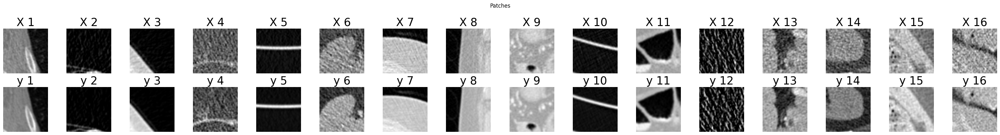

In [ ]:
visualize_patches(X_train, y_train)

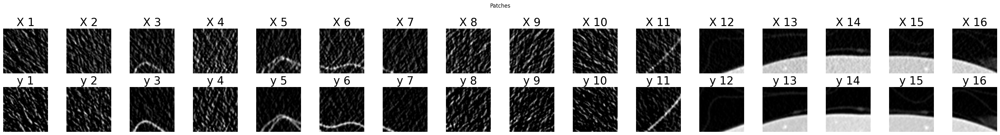

In [ ]:
visualize_patches(X_val, y_val)

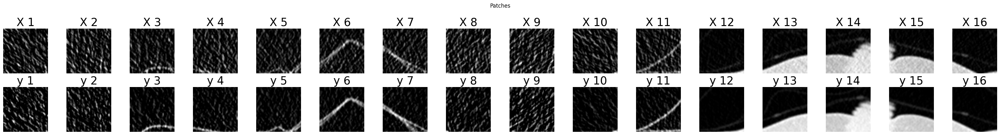

In [ ]:
visualize_patches(X_test, y_test)

## 모델

In [45]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [46]:
import torch
import torch.nn as nn

class RedCNN(nn.Module):
    def __init__(self):
        super(RedCNN, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)
        
        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()


    def forward(self, x):
        # 인코더 부분
        residual1 = x  # 첫 번째 잔차 저장
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x  # 두 번째 잔차 저장
        x = self.relu(self.conv3(x))
        x = self.relu(self.conv4(x))
        residual3 = x  # 세 번째 잔차 저장
        x = self.relu(self.conv5(x))
        
        # 디코더 부분 (잔차를 더해줌)
        x = self.relu(self.deconv1(x)) + residual3  # 세 번째 잔차 연결
        x = self.relu(self.deconv2(x))
        x = self.relu((self.deconv3(x)) + residual2)  # 두 번째 잔차 연결
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1  # 첫 번째 잔차 연결
        
        return x

In [47]:
model = RedCNN().to(device)
model

RedCNN(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), stride=(1, 1))
  (relu): ReLU()
)

In [48]:
import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

<module 'utils.train_eval_util' from '/root/utils/train_eval_util.py'>

In [49]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [50]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

In [51]:
print(f'X : {X_test.shape}\nX_hat : {model(X_test.to(device)).shape}\ny : {y_test.shape}')

NameError: name 'X_test' is not defined

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

X_train, y_train = next(iter(train_loader))

# 데이터를 모델과 동일한 디바이스로 이동
X_train = X_train.to(device)
y_train = y_train.to(device)  # 필요하면 y_train도 옮기기

# 모델도 동일한 디바이스로 이동
model = model.to(device)

X_hat = model(X_train)

print(X_train.shape, y_train.shape, X_hat.shape)

torch.Size([16, 1, 55, 55]) torch.Size([16, 1, 55, 55]) torch.Size([16, 1, 55, 55])


In [ ]:
conv_layer = nn.Conv2d(1, 96, 5, 1, 0)
conv_layer(X_train.to('cpu')).shape

torch.Size([16, 96, 51, 51])

## 학습

In [ ]:
# import os
# import shutil

# patch_folder = "/root/base/"

# # 폴더가 존재하는지 확인
# if not os.path.exists(patch_folder):
#     os.makedirs(patch_folder)  # 폴더 생성
# else:
#     # 폴더 내부 파일 및 하위 폴더 삭제
#     for filename in os.listdir(patch_folder):
#         file_path = os.path.join(patch_folder, filename)
#         try:
#             if os.path.isfile(file_path) or os.path.islink(file_path):
#                 os.unlink(file_path)  # 파일 또는 심볼릭 링크 삭제
#             elif os.path.isdir(file_path):
#                 shutil.rmtree(file_path)  # 하위 폴더 삭제
#         except Exception as e:
#             print(f"파일 삭제 중 오류 발생: {file_path} - {e}")

# print(f"✅ '{patch_folder}' 폴더 준비 완료!")

✅ '/root/base/' 폴더 준비 완료!


In [53]:
model_name = 'base/red_cnn_base'
epochs = 2 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), f"./{model_name}.pth")
        print('model is saving...')

Epoch 0 - Training:   2%|▏         | 1009/57579 [00:14<11:58, 78.74it/s]

train loss : 0.0059464057154254985


Epoch 0 - Training:   3%|▎         | 2009/57579 [00:27<11:47, 78.59it/s]

train loss : 0.0034494431557832287


Epoch 0 - Training:   5%|▌         | 3009/57579 [00:40<11:37, 78.20it/s]

train loss : 0.0030734703822527082


Epoch 0 - Training:   7%|▋         | 4009/57579 [00:53<11:35, 76.98it/s]

train loss : 0.0028939292492577806


Epoch 0 - Training:   9%|▊         | 5009/57579 [01:05<11:15, 77.77it/s]

train loss : 0.0028114030479919165


Epoch 0 - Training:  10%|█         | 6009/57579 [01:18<10:58, 78.30it/s]

train loss : 0.0027205537531990558


Epoch 0 - Training:  12%|█▏        | 7009/57579 [01:31<11:08, 75.70it/s]

train loss : 0.0026482377724023538


Epoch 0 - Training:  14%|█▍        | 8009/57579 [01:44<10:43, 77.07it/s]

train loss : 0.002565662189037539


Epoch 0 - Training:  16%|█▌        | 9009/57579 [01:57<10:28, 77.30it/s]

train loss : 0.0025058199795894324


Epoch 0 - Training:  17%|█▋        | 10009/57579 [02:10<10:13, 77.57it/s]

train loss : 0.0025250257782754486


Epoch 0 - Training:  19%|█▉        | 11009/57579 [02:23<10:05, 76.86it/s]

train loss : 0.0024382845412474125


Epoch 0 - Training:  21%|██        | 12009/57579 [02:36<09:48, 77.41it/s]

train loss : 0.0024621526770060883


Epoch 0 - Training:  23%|██▎       | 13009/57579 [02:48<09:37, 77.13it/s]

train loss : 0.0024084431980736553


Epoch 0 - Training:  24%|██▍       | 14009/57579 [03:01<09:24, 77.23it/s]

train loss : 0.0023509321810561232


Epoch 0 - Training:  26%|██▌       | 15009/57579 [03:14<09:12, 77.00it/s]

train loss : 0.0023371994263725357


Epoch 0 - Training:  28%|██▊       | 16009/57579 [03:27<09:05, 76.18it/s]

train loss : 0.0023663222827599384


Epoch 0 - Training:  30%|██▉       | 17009/57579 [03:40<08:48, 76.76it/s]

train loss : 0.0022975402200245297


Epoch 0 - Training:  31%|███▏      | 18009/57579 [03:53<08:34, 76.92it/s]

train loss : 0.002269832296529785


Epoch 0 - Training:  33%|███▎      | 19009/57579 [04:06<08:22, 76.79it/s]

train loss : 0.0023220978429308163


Epoch 0 - Training:  35%|███▍      | 20009/57579 [04:19<08:06, 77.29it/s]

train loss : 0.002259843153762631


Epoch 0 - Training:  36%|███▋      | 21009/57579 [04:32<08:01, 75.98it/s]

train loss : 0.0022238532500341536


Epoch 0 - Training:  38%|███▊      | 22009/57579 [04:45<07:40, 77.24it/s]

train loss : 0.0022225855861324815


Epoch 0 - Training:  40%|███▉      | 23009/57579 [04:58<07:28, 77.11it/s]

train loss : 0.0022326473459834233


Epoch 0 - Training:  42%|████▏     | 24009/57579 [05:11<07:15, 77.14it/s]

train loss : 0.002187637143128086


Epoch 0 - Training:  43%|████▎     | 25009/57579 [05:24<07:02, 77.11it/s]

train loss : 0.002212304663320538


Epoch 0 - Training:  45%|████▌     | 26009/57579 [05:37<06:48, 77.31it/s]

train loss : 0.0021935010229353793


Epoch 0 - Training:  47%|████▋     | 27009/57579 [05:50<06:38, 76.63it/s]

train loss : 0.002222382202220615


Epoch 0 - Training:  49%|████▊     | 28009/57579 [06:03<06:23, 77.11it/s]

train loss : 0.002158332520572003


Epoch 0 - Training:  50%|█████     | 29009/57579 [06:16<06:10, 77.03it/s]

train loss : 0.0021691658916533924


Epoch 0 - Training:  52%|█████▏    | 30009/57579 [06:29<05:58, 76.96it/s]

train loss : 0.0021885897810570896


Epoch 0 - Training:  54%|█████▍    | 31009/57579 [06:42<05:45, 76.89it/s]

train loss : 0.002140486699237954


Epoch 0 - Training:  56%|█████▌    | 32009/57579 [06:55<05:30, 77.26it/s]

train loss : 0.0021589119340642356


Epoch 0 - Training:  57%|█████▋    | 33009/57579 [07:08<05:18, 77.09it/s]

train loss : 0.0021374740978353656


Epoch 0 - Training:  59%|█████▉    | 34009/57579 [07:21<05:05, 77.15it/s]

train loss : 0.002150616952392738


Epoch 0 - Training:  61%|██████    | 35009/57579 [07:34<04:52, 77.08it/s]

train loss : 0.0021307013813056984


Epoch 0 - Training:  63%|██████▎   | 36009/57579 [07:47<04:43, 76.01it/s]

train loss : 0.0020774733439320697


Epoch 0 - Training:  64%|██████▍   | 37009/57579 [08:00<04:26, 77.15it/s]

train loss : 0.002103801496385131


Epoch 0 - Training:  66%|██████▌   | 38009/57579 [08:13<04:13, 77.21it/s]

train loss : 0.002119466948148329


Epoch 0 - Training:  68%|██████▊   | 39009/57579 [08:26<04:01, 77.00it/s]

train loss : 0.0021048645039554686


Epoch 0 - Training:  69%|██████▉   | 40009/57579 [08:39<03:47, 77.20it/s]

train loss : 0.002094340187381022


Epoch 0 - Training:  71%|███████   | 41009/57579 [08:51<03:37, 76.34it/s]

train loss : 0.002093166977108922


Epoch 0 - Training:  73%|███████▎  | 42009/57579 [09:04<03:21, 77.09it/s]

train loss : 0.002087350940448232


Epoch 0 - Training:  75%|███████▍  | 43009/57579 [09:17<03:09, 76.71it/s]

train loss : 0.0021004901311243883


Epoch 0 - Training:  76%|███████▋  | 44009/57579 [09:30<02:56, 76.96it/s]

train loss : 0.0020942203790182247


Epoch 0 - Training:  78%|███████▊  | 45009/57579 [09:43<02:43, 76.79it/s]

train loss : 0.002094722993322648


Epoch 0 - Training:  80%|███████▉  | 46009/57579 [09:56<02:29, 77.19it/s]

train loss : 0.002053791184851434


Epoch 0 - Training:  82%|████████▏ | 47009/57579 [10:09<02:19, 75.82it/s]

train loss : 0.002100639517128002


Epoch 0 - Training:  83%|████████▎ | 48009/57579 [10:22<02:04, 77.05it/s]

train loss : 0.0020438646051334215


Epoch 0 - Training:  85%|████████▌ | 49009/57579 [10:35<01:51, 76.75it/s]

train loss : 0.002080909765267279


Epoch 0 - Training:  87%|████████▋ | 50009/57579 [10:48<01:38, 77.13it/s]

train loss : 0.002064331767265685


Epoch 0 - Training:  89%|████████▊ | 51009/57579 [11:01<01:25, 76.56it/s]

train loss : 0.002069241122051608


Epoch 0 - Training:  90%|█████████ | 52009/57579 [11:14<01:12, 76.69it/s]

train loss : 0.002058726447809022


Epoch 0 - Training:  92%|█████████▏| 53009/57579 [11:27<00:59, 76.83it/s]

train loss : 0.00206788318551844


Epoch 0 - Training:  94%|█████████▍| 54009/57579 [11:40<00:46, 76.72it/s]

train loss : 0.0020428843521513047


Epoch 0 - Training:  96%|█████████▌| 55009/57579 [11:53<00:33, 76.98it/s]

train loss : 0.002095258504501544


Epoch 0 - Training:  97%|█████████▋| 56009/57579 [12:06<00:20, 77.18it/s]

train loss : 0.002087829997530207


Epoch 0 - Training:  99%|█████████▉| 57009/57579 [12:19<00:07, 75.51it/s]

train loss : 0.0020324180261814036


Epoch 0 - Evaluating:  22%|██▏       | 1040/4815 [00:04<00:17, 217.58it/s]

train loss : 0.0015450729262374808


Epoch 0 - Evaluating:  42%|████▏     | 2042/4815 [00:09<00:12, 218.90it/s]

train loss : 0.002746810588738299


Epoch 0 - Evaluating:  63%|██████▎   | 3025/4815 [00:13<00:08, 218.81it/s]

train loss : 0.001792176184600976


Epoch 0 - Evaluating:  84%|████████▎ | 4032/4815 [00:18<00:03, 216.84it/s]

train loss : 0.0023630792709227535


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:22<00:00, 210.20it/s]

Epoch [1/2], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...



Epoch 1 - Training:   2%|▏         | 1008/57579 [00:13<12:11, 77.35it/s]

train loss : 0.002008089246693999


Epoch 1 - Training:   3%|▎         | 2008/57579 [00:25<12:00, 77.16it/s]

train loss : 0.0020389619467314334


Epoch 1 - Training:   5%|▌         | 3008/57579 [00:38<11:43, 77.52it/s]

train loss : 0.0020210709574166683


Epoch 1 - Training:   7%|▋         | 4008/57579 [00:51<11:39, 76.58it/s]

train loss : 0.0020002320202765988


Epoch 1 - Training:   9%|▊         | 5008/57579 [01:04<11:20, 77.30it/s]

train loss : 0.0020694968475145287


Epoch 1 - Training:  10%|█         | 6008/57579 [01:17<11:09, 77.00it/s]

train loss : 0.0020260094447876326


Epoch 1 - Training:  12%|█▏        | 7008/57579 [01:30<10:55, 77.15it/s]

train loss : 0.0019862821320421062


Epoch 1 - Training:  14%|█▍        | 8008/57579 [01:43<10:42, 77.13it/s]

train loss : 0.002024419206951279


Epoch 1 - Training:  16%|█▌        | 9008/57579 [01:56<10:28, 77.24it/s]

train loss : 0.0020283514501643366


Epoch 1 - Training:  17%|█▋        | 10008/57579 [02:09<10:15, 77.32it/s]

train loss : 0.001993151245638728


Epoch 1 - Training:  19%|█▉        | 11008/57579 [02:22<10:05, 76.93it/s]

train loss : 0.001982177959056571


Epoch 1 - Training:  21%|██        | 12008/57579 [02:35<09:55, 76.53it/s]

train loss : 0.0020109710255637766


Epoch 1 - Training:  23%|██▎       | 13008/57579 [02:48<09:43, 76.37it/s]

train loss : 0.0019916334155132063


Epoch 1 - Training:  24%|██▍       | 14008/57579 [03:01<09:26, 76.94it/s]

train loss : 0.00204575831576949


Epoch 1 - Training:  26%|██▌       | 15008/57579 [03:14<09:11, 77.13it/s]

train loss : 0.0020435399802518077


Epoch 1 - Training:  28%|██▊       | 16008/57579 [03:27<09:06, 76.08it/s]

train loss : 0.0020131738779018632


Epoch 1 - Training:  30%|██▉       | 17008/57579 [03:40<08:58, 75.38it/s]

train loss : 0.0019878201060928406


Epoch 1 - Training:  31%|███▏      | 18008/57579 [03:53<08:33, 77.04it/s]

train loss : 0.0019753656244138255


Epoch 1 - Training:  33%|███▎      | 19008/57579 [04:06<08:20, 76.99it/s]

train loss : 0.0019756827597739177


Epoch 1 - Training:  35%|███▍      | 20008/57579 [04:19<08:09, 76.68it/s]

train loss : 0.00199660878861323


Epoch 1 - Training:  36%|███▋      | 21008/57579 [04:32<07:54, 77.03it/s]

train loss : 0.002008326905022841


Epoch 1 - Training:  38%|███▊      | 22008/57579 [04:45<07:43, 76.82it/s]

train loss : 0.001965258998214267


Epoch 1 - Training:  40%|███▉      | 23008/57579 [04:58<07:30, 76.81it/s]

train loss : 0.0019802106515853664


Epoch 1 - Training:  42%|████▏     | 24008/57579 [05:10<07:16, 76.99it/s]

train loss : 0.001978893147257622


Epoch 1 - Training:  43%|████▎     | 25008/57579 [05:23<07:00, 77.42it/s]

train loss : 0.002012094797042664


Epoch 1 - Training:  45%|████▌     | 26008/57579 [05:36<06:50, 76.88it/s]

train loss : 0.001971205684239976


Epoch 1 - Training:  47%|████▋     | 27008/57579 [05:49<06:36, 77.18it/s]

train loss : 0.001980053283739835


Epoch 1 - Training:  49%|████▊     | 28008/57579 [06:02<06:26, 76.45it/s]

train loss : 0.0019760951750795357


Epoch 1 - Training:  50%|█████     | 29008/57579 [06:15<06:13, 76.40it/s]

train loss : 0.0019684531686943955


Epoch 1 - Training:  52%|█████▏    | 30008/57579 [06:28<05:57, 77.19it/s]

train loss : 0.0019790221219300294


Epoch 1 - Training:  54%|█████▍    | 31008/57579 [06:41<05:45, 76.96it/s]

train loss : 0.0019808229472255334


Epoch 1 - Training:  56%|█████▌    | 32008/57579 [06:54<05:30, 77.30it/s]

train loss : 0.0019622953155776484


Epoch 1 - Training:  57%|█████▋    | 33008/57579 [07:07<05:19, 76.86it/s]

train loss : 0.0019622466897708363


Epoch 1 - Training:  59%|█████▉    | 34008/57579 [07:20<05:05, 77.16it/s]

train loss : 0.0019561152383103034


Epoch 1 - Training:  61%|██████    | 35008/57579 [07:33<04:58, 75.74it/s]

train loss : 0.0019300557762035168


Epoch 1 - Training:  63%|██████▎   | 36008/57579 [07:46<04:40, 76.85it/s]

train loss : 0.001943675085552968


Epoch 1 - Training:  64%|██████▍   | 37008/57579 [07:59<04:27, 76.86it/s]

train loss : 0.001956628228130285


Epoch 1 - Training:  66%|██████▌   | 38008/57579 [08:12<04:13, 77.21it/s]

train loss : 0.001960855107055977


Epoch 1 - Training:  68%|██████▊   | 39008/57579 [08:25<04:02, 76.67it/s]

train loss : 0.0019635496697737835


Epoch 1 - Training:  69%|██████▉   | 40008/57579 [08:38<03:47, 77.20it/s]

train loss : 0.00198053114983486


Epoch 1 - Training:  71%|███████   | 41008/57579 [08:51<03:35, 76.73it/s]

train loss : 0.00195455408556154


Epoch 1 - Training:  73%|███████▎  | 42008/57579 [09:04<03:22, 76.83it/s]

train loss : 0.001959624165610876


Epoch 1 - Training:  75%|███████▍  | 43008/57579 [09:17<03:08, 77.17it/s]

train loss : 0.0019437606470892206


Epoch 1 - Training:  76%|███████▋  | 44008/57579 [09:30<02:55, 77.12it/s]

train loss : 0.0019655836125602945


Epoch 1 - Training:  78%|███████▊  | 45008/57579 [09:43<02:42, 77.17it/s]

train loss : 0.0019184087247995194


Epoch 1 - Training:  80%|███████▉  | 46008/57579 [09:56<02:31, 76.49it/s]

train loss : 0.001962473209539894


Epoch 1 - Training:  82%|████████▏ | 47008/57579 [10:09<02:16, 77.31it/s]

train loss : 0.001988962795585394


Epoch 1 - Training:  83%|████████▎ | 48008/57579 [10:22<02:04, 76.93it/s]

train loss : 0.0019278755983687006


Epoch 1 - Training:  85%|████████▌ | 49008/57579 [10:35<01:50, 77.30it/s]

train loss : 0.0019682382757309825


Epoch 1 - Training:  87%|████████▋ | 50008/57579 [10:48<01:39, 76.44it/s]

train loss : 0.0019659394393092954


Epoch 1 - Training:  89%|████████▊ | 51008/57579 [11:00<01:25, 76.79it/s]

train loss : 0.001929315981513355


Epoch 1 - Training:  90%|█████████ | 52008/57579 [11:13<01:12, 77.26it/s]

train loss : 0.0019398754393332638


Epoch 1 - Training:  92%|█████████▏| 53008/57579 [11:26<00:59, 76.63it/s]

train loss : 0.0019337301718769595


Epoch 1 - Training:  94%|█████████▍| 54008/57579 [11:39<00:46, 76.62it/s]

train loss : 0.0019293490878771991


Epoch 1 - Training:  96%|█████████▌| 55008/57579 [11:52<00:33, 77.31it/s]

train loss : 0.001962331824877765


Epoch 1 - Training:  97%|█████████▋| 56008/57579 [12:05<00:20, 76.64it/s]

train loss : 0.0019391969486605375


Epoch 1 - Training:  99%|█████████▉| 57008/57579 [12:18<00:07, 77.29it/s]

train loss : 0.0019293174925842321


Epoch 1 - Evaluating:  22%|██▏       | 1040/4815 [00:04<00:17, 218.44it/s]

train loss : 0.0014894562525878427


Epoch 1 - Evaluating:  42%|████▏     | 2033/4815 [00:09<00:12, 219.08it/s]

train loss : 0.0026251439200059394


Epoch 1 - Evaluating:  63%|██████▎   | 3026/4815 [00:13<00:08, 217.58it/s]

train loss : 0.0017327634296852921


Epoch 1 - Evaluating:  84%|████████▍ | 4040/4815 [00:18<00:03, 215.03it/s]

train loss : 0.002279526070255088


Epoch 1 - Evaluating: 100%|██████████| 4815/4815 [00:22<00:00, 210.89it/s]

Epoch [2/2], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...


In [54]:
%cd /root/base

/root/base


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [55]:
!pwd

/root/base


In [56]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [57]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [58]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

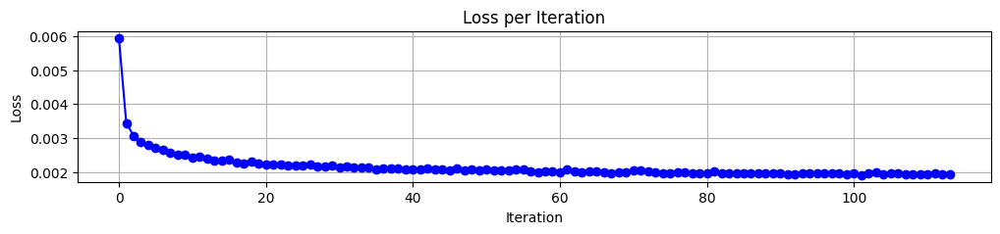

In [59]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

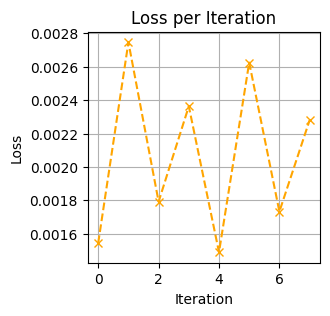

In [60]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

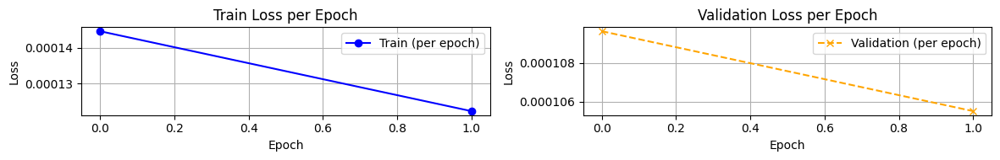

In [61]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

## 평가

In [62]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [63]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model.load_state_dict(torch.load('/root/base/red_cnn_base.pth'))

<All keys matched successfully>

In [64]:
test_path = '/root/patch/test_dataset.pt'
test_dataset = torch.load(test_path)
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

1190

In [65]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  85%|████████▍ | 1008/1190 [00:18<00:03, 54.52it/s]

train loss : 0.008299349963937858


Evaluating: 100%|██████████| 1190/1190 [00:21<00:00, 55.10it/s]


In [66]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [67]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [68]:
def rescale(normalized_img, original_min=-1000, original_max=3000):
    """
    정규화된 이미지를 원래 HU 범위로 복원하는 함수

    :param normalized_img: 정규화된 이미지 (0~1)
    :param original_min: 원본 HU 최소값
    :param original_max: 원본 HU 최대값
    :return: 원래 HU 값으로 복원된 이미지
    """
    restored_img = normalized_img * (original_max - original_min) + original_min
    return restored_img

In [69]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [70]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

In [78]:
# trans_img(X_test).shape

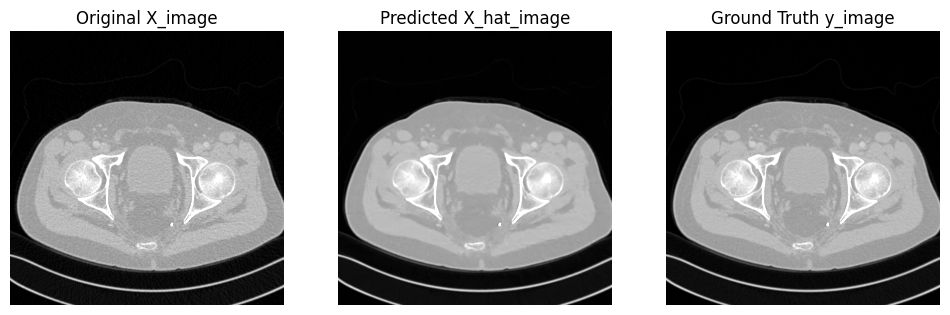

In [72]:
# 1. 가장 좋은 값 가져오기
X_test, y_test, X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'best')

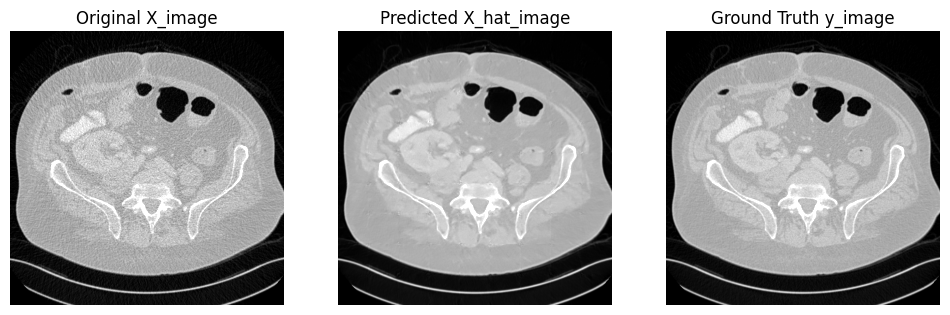

In [73]:
# 2. 가장 나쁜 값 가져오기
X_test, y_test, X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'worst')

In [74]:
# rmse, psnr, ssim 구하기

import torch
import torch.nn as nn
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from tqdm import tqdm

criterion = nn.MSELoss()
interval = 100

# 저장된 모델 로드
model_path = '/root/base/red_cnn_base.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model.load_state_dict(torch.load(model_path))

# 평가 지표 계산 추가
def calculate_psnr(y_true, y_pred):
    """PSNR 계산 함수"""
    y_true = y_true.cpu().numpy()
    y_pred = y_pred.cpu().numpy()
    return peak_signal_noise_ratio(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

def calculate_ssim(y_true, y_pred):
    """SSIM 계산 함수"""
    y_true = y_true.squeeze(0).cpu().numpy()
    y_pred = y_pred.squeeze(0).cpu().numpy()
    return structural_similarity(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

# evaluate 부분 + top10 best&worst
model.eval()
running_loss = 0.0
running_psnr = 0.0
running_ssim = 0.0
psnr_list = []
ssim_list = []
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        mse_loss = criterion(X_hat, y)

        # RMSE 계산
        rms_loss = torch.sqrt(mse_loss)
        running_loss += rms_loss.item()

        # PSNR, SSIM 계산
        for j in range(X.size(0)):  # 배치 내부 개별 이미지에 대해 계산
            psnr = calculate_psnr(y[j, :, :, :], X_hat[j, :, :, :])
            ssim = calculate_ssim(y[j, :, :, :], X_hat[j, :, :, :]) 
            running_psnr += psnr # batch에 대해 더해준다.
            running_ssim += ssim

        if mse_loss < best_loss:
            best_loss = mse_loss
            best = (X, y, X_hat)
        if mse_loss > worst_loss:
            worst_loss = mse_loss
            worst = (X, y, X_hat)

        if i % interval == interval - 1:
            interval_loss = running_loss / interval
            interval_psnr = running_psnr / (interval * X.size(0)) # batch에 대해 나눠준다
            interval_ssim = running_ssim / (interval * X.size(0))

            loss_list.append(interval_loss)
            psnr_list.append(interval_psnr)
            ssim_list.append(interval_ssim)

            total_loss += interval_loss
            running_loss = 0.0
            running_psnr = 0.0
            running_ssim = 0.0
            tqdm.write(f'RMSE per interval: {interval_loss:.4f}, PSNR per interval: {interval_psnr:.2f}, SSIM per interval: {interval_ssim:.4f}')
            # tqdm.write(f'RMSE per interval: {interval_loss}, PSNR per interval: {interval_psnr}, SSIM per interval: {interval_ssim}')

    # 평균 RMSE 출력
average_loss = total_loss / len(loss_list)
print(f"Average RMSE over all intervals: {average_loss:.6f}")

Evaluating:   8%|▊         | 101/1190 [00:04<00:53, 20.21it/s]

RMSE per interval: 0.0120, PSNR per interval: 40.25, SSIM per interval: 0.9415


Evaluating:  17%|█▋        | 203/1190 [00:10<00:48, 20.29it/s]

RMSE per interval: 0.0069, PSNR per interval: 45.65, SSIM per interval: 0.9721


Evaluating:  25%|██▌       | 302/1190 [00:14<00:44, 19.82it/s]

RMSE per interval: 0.0089, PSNR per interval: 43.51, SSIM per interval: 0.9593


Evaluating:  34%|███▍      | 402/1190 [00:19<00:39, 20.09it/s]

RMSE per interval: 0.0125, PSNR per interval: 40.29, SSIM per interval: 0.9289


Evaluating:  42%|████▏     | 503/1190 [00:24<00:34, 20.01it/s]

RMSE per interval: 0.0115, PSNR per interval: 41.49, SSIM per interval: 0.9439


Evaluating:  51%|█████     | 602/1190 [00:29<00:29, 20.15it/s]

RMSE per interval: 0.0090, PSNR per interval: 44.18, SSIM per interval: 0.9623


Evaluating:  59%|█████▉    | 704/1190 [00:34<00:24, 20.15it/s]

RMSE per interval: 0.0093, PSNR per interval: 42.91, SSIM per interval: 0.9602


Evaluating:  67%|██████▋   | 803/1190 [00:39<00:19, 20.14it/s]

RMSE per interval: 0.0092, PSNR per interval: 43.62, SSIM per interval: 0.9614


Evaluating:  76%|███████▌  | 902/1190 [00:44<00:14, 20.14it/s]

RMSE per interval: 0.0095, PSNR per interval: 43.07, SSIM per interval: 0.9553


Evaluating:  84%|████████▍ | 1004/1190 [00:49<00:09, 20.03it/s]

RMSE per interval: 0.0087, PSNR per interval: 44.33, SSIM per interval: 0.9627


Evaluating:  93%|█████████▎| 1102/1190 [00:54<00:04, 20.03it/s]

RMSE per interval: 0.0092, PSNR per interval: 44.34, SSIM per interval: 0.9651


Evaluating: 100%|██████████| 1190/1190 [00:59<00:00, 20.15it/s]

Average RMSE over all intervals: 0.009671


In [76]:
import os
import numpy as np

s = '/root/base/metric/'

# 파일 저장 경로
file_names = {
    "loss": "loss_list.npy",
    "psnr": "psnr_list.npy",
    "ssim": "ssim_list.npy"
}

# 각 리스트를 저장
np.save(s+file_names["loss"], loss_list)
np.save(s+file_names["psnr"], psnr_list)
np.save(s+file_names["ssim"], ssim_list)

print(f"Lists have been saved in the {s} folder:\n- {file_names['loss']}\n- {file_names['psnr']}\n- {file_names['ssim']}")

Lists have been saved in the /root/base/metric/ folder:
- loss_list.npy
- psnr_list.npy
- ssim_list.npy


# 클러스터링 모델별 학습

In [79]:
%cd cluster

[Errno 2] No such file or directory: 'cluster'
/root/base


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})


In [80]:
!pwd

/root/base


## 함수선언

In [81]:
def normlize(dicom_path):
    dicom_data = pydicom.dcmread(dicom_path)
    img = dicom_data.pixel_array.astype(np.float32) * dicom_data.RescaleSlope + dicom_data.RescaleIntercept

    # CT 값 클리핑 (일반적인 HU 범위: -1000~3000) <- 극단적인 값 제거를 위해
    img = np.clip(img, -1000, 3000) # 3000이 넘어가면 3000으로 바꿈

    # 정규화 (0~1 사이로)
    scaled_img = (img - img.min()) / (img.max() - img.min())
    
    # 제일 앞에 1차원 넣기
    img = np.expand_dims(scaled_img, axis=0)

    return img # 1x512x512

In [82]:
# Mayo 2016 데이터셋에서 DICOM 파일 찾기
base_folder = "/root/mayo2016"
img_type = "quarter_1mm"
dicom_files = []

# 모든 L0xx 폴더에서 DICOM 파일 수집
L_patients = L_list
for patient_id in L_patients:
    patient_folder = os.path.join(base_folder, patient_id, "quarter_1mm") # quarter_1mm
    if os.path.exists(patient_folder):
        patient_files = [os.path.join(patient_folder, f) 
                        for f in os.listdir(patient_folder) 
                        if f.endswith(".IMA")]
        dicom_files.extend(patient_files)

In [83]:
img = normlize(dicom_files[0])
img.shape, img.max(), img.min() # 0~1 사이어야 유리하다.

((1, 512, 512), 1.0, 0.0)

In [84]:
def extract_patches(img, patch_size=55, interval=55):
  patches = []
  _, height, width = img.shape
  for y in range(0, height - patch_size + 1, interval):
    for x in range(0, width - patch_size + 1, interval):
      patch = img[:, y:y + patch_size, x:x + patch_size]
      patches.append(patch)
  patches = np.array(patches)
  return patches # patch수x1x55x55

추출된 패치 수: 81
각 패치의 크기: (1, 55, 55)


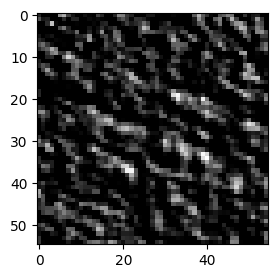

In [85]:
# 1x512x512 이미지에서 1x55x55 패치 추출
patch_size = 55
interval = 55
patches = extract_patches(img, patch_size, interval)

print(f"추출된 패치 수: {len(patches)}")
print(f"각 패치의 크기: {patches[0].shape}")

# 이미지 확인
plt.imshow(np.squeeze(patches[0]), cmap='gray')
plt.show()

In [86]:
from scipy.ndimage import rotate, zoom
import random

def augment_patches(X_patches, y_patches, p=0.5):
    
    X_augmented_patches, y_augmented_patches = [], []
    
    # random이 들어가기에, X랑 y를 동시에 넣어준다.
    for i, (X_patch, y_patch) in enumerate(zip(X_patches, y_patches)):
        # 원본 패치 추가
        X_augmented_patches.append(X_patch)
        y_augmented_patches.append(y_patch)

        if random.random() < p:
            # 1. 90, 270으로 돌려보자.(뒤집기랑 조금 다르긴 하지만, 점대칭 vs 선대칭, 그냥 +-90도만 쓰자.)
            X, y = rotate(X_patch, 90, axes=(1, 2), reshape=False), rotate(y_patch, 90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
            X, y = rotate(X_patch, -90, axes=(1, 2), reshape=False), rotate(y_patch, -90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 2. 수직 뒤집기
            X,y = np.flip(X_patch, axis=1),np.flip(y_patch, axis=1)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 3. 수평 뒤집기
            X,y = np.flip(X_patch, axis=2),np.flip(y_patch, axis=2)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)

    return np.array(X_augmented_patches), np.array(y_augmented_patches)

In [87]:
def patch_maker_W_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  X_augmented_patches, y_augmented_patches = augment_patches(X_patches, y_patches, p=0.5)
  # X_augmented_patches = torch.from_numpy(X_augmented_patches).float()  # dtype=float 변환 추가
  # y_augmented_patches = torch.from_numpy(y_augmented_patches).float()
  return X_augmented_patches, y_augmented_patches

In [88]:
def patch_maker_WO_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  # X_patches = torch.from_numpy(X_patches).float()  # dtype=float 변환 추가
  # y_patches = torch.from_numpy(y_patches).float()
  return X_patches, y_patches

In [89]:
i,j = 0,0
X_dir = sorted(glob.glob(f'/root/mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'/root/mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_patches, y_patches = patch_maker_W_aug(X_dir, y_dir)
print(X_patches.shape, y_patches.shape) # 3배 정도 늘어남

X_patches, y_patches = patch_maker_WO_aug(X_dir, y_dir)
print(X_patches.shape, y_patches.shape) # 1배 (기본)

(237, 1, 55, 55) (237, 1, 55, 55)
(81, 1, 55, 55) (81, 1, 55, 55)


## 데이터셋 정의 및 저장

In [90]:
import os
import pandas as pd
import torch
import glob
from torch.utils.data import Dataset
from tqdm import tqdm

class CustomDataset(Dataset):
    def __init__(self, data_type, patch_maker, df_clusters, cluster_id, L_list=L_list, data_label=data_label):
        self.data_type = data_type
        self.patch_maker = patch_maker
        self.df_clusters = df_clusters
        self.cluster_id = cluster_id
        self.L_list = L_list
        self.data_label = data_label
        self.image_pairs = []

        X_dir_list, y_dir_list = [], []
        for L in self.L_list:
            X_dir, y_dir = self.get_data_range(L)
            X_dir_list += X_dir
            y_dir_list += y_dir

        for X_dir, y_dir in tqdm(zip(X_dir_list, y_dir_list), total=len(X_dir_list), desc=f"{self.data_type} is processing"):
            X_patches, y_patches = self.patch_maker(X_dir, y_dir)
            for i in range(X_patches.shape[0]):
                X_patch, y_patch = torch.from_numpy(X_patches[i]), torch.from_numpy(y_patches[i])  # torch 변환
                self.image_pairs.append((X_patch, y_patch))

    def get_data_range(self, L):
        """클러스터 ID에 해당하는 파일만 선택 (y_dir은 x_dir의 인덱스에 맞게 선택)"""
        X_dir = sorted(glob.glob(f'/root/mayo2016/{L}/{self.data_label[0]}/*.IMA'))
        y_dir = sorted(glob.glob(f'/root/mayo2016/{L}/{self.data_label[1]}/*.IMA'))

        # 클러스터 ID에 해당하는 X 파일만 필터링
        cluster_files = set(self.df_clusters[self.df_clusters["Cluster Label"] == self.cluster_id]["DICOM Location"].values)
        X_filtered = [x for x in X_dir if x in cluster_files]

        # X_filtered에서 선택된 파일들의 인덱스를 기준으로 y_dir도 선택
        X_indices = [X_dir.index(x) for x in X_filtered]  # 선택된 x의 인덱스
        y_filtered = [y_dir[i] for i in X_indices]  # 같은 인덱스를 사용하여 y 선택

        n1, n2 = len(X_filtered), len(y_filtered)
        if self.data_type == 'train':
            X_range = X_filtered[:int(n1 * 0.64)]
            y_range = y_filtered[:int(n2 * 0.64)]
        elif self.data_type == 'val':
            X_range = X_filtered[int(n1 * 0.64):int(n1 * 0.8)]
            y_range = y_filtered[int(n2 * 0.64):int(n2 * 0.8)]
        else:  # test
            X_range = X_filtered[int(n1 * 0.8):]
            y_range = y_filtered[int(n2 * 0.8):]

        return X_range, y_range

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        X = self.image_pairs[idx][0]
        y = self.image_pairs[idx][1]
        return X, y

In [91]:
import pandas as pd
df_clusters = pd.read_csv("/root/df_clusters.csv")
df_clusters.head()

,DICOM Location,Cluster Label
0,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,2
1,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,1
2,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,1
3,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,1
4,/root/mayo2016/L067/quarter_1mm/L067_QD_1_1.CT...,2


In [92]:
df_clusters.loc[:,'Cluster Label'].unique()

array([2, 1, 0])

In [93]:
df_clusters.shape

(5936, 2)

In [95]:
num = 0
for L in L_list:
    for label in data_label:
        num += len(glob.glob(f'/root/mayo2016/{L}/{label}/*.IMA'))
num/2

5936.0

In [97]:
# cluster_id = 0

# patch_folder = f"/root/cluster/c{cluster_id}/"
# train_path = patch_folder+'train_dataset.pt'
# val_path = patch_folder+'val_dataset.pt'
# test_path = patch_folder+'test_dataset.pt'

# train_dataset = CustomDataset(data_type='train', patch_maker=patch_maker_W_aug, df_clusters=df_clusters, cluster_id=cluster_id)
# val_dataset = CustomDataset(data_type='val', patch_maker=patch_maker_WO_aug, df_clusters=df_clusters, cluster_id=cluster_id)
# test_dataset = CustomDataset(data_type='test', patch_maker=patch_maker_WO_aug, df_clusters=df_clusters, cluster_id=cluster_id)

# # 데이터셋 저장
# torch.save(train_dataset, train_path)
# torch.save(val_dataset, val_path)
# torch.save(test_dataset, test_path)

In [ ]:
# cluster_id = 1

# patch_folder = f"/root/cluster/c{cluster_id}/"
# train_path = patch_folder+'train_dataset.pt'
# val_path = patch_folder+'val_dataset.pt'
# test_path = patch_folder+'test_dataset.pt'

# train_dataset = CustomDataset(data_type='train', patch_maker=patch_maker_W_aug, df_clusters=df_clusters, cluster_id=cluster_id)
# val_dataset = CustomDataset(data_type='val', patch_maker=patch_maker_WO_aug, df_clusters=df_clusters, cluster_id=cluster_id)
# test_dataset = CustomDataset(data_type='test', patch_maker=patch_maker_WO_aug, df_clusters=df_clusters, cluster_id=cluster_id)

# # 데이터셋 저장
# torch.save(train_dataset, train_path)
# torch.save(val_dataset, val_path)
# torch.save(test_dataset, test_path)

test is processing: 100%|██████████| 516/516 [00:02<00:00, 181.73it/s]


In [ ]:
# cluster_id = 2

# patch_folder = f"/root/cluster/c{cluster_id}/"
# train_path = patch_folder+'train_dataset.pt'
# val_path = patch_folder+'val_dataset.pt'
# test_path = patch_folder+'test_dataset.pt'

# train_dataset = CustomDataset(data_type='train', patch_maker=patch_maker_W_aug, df_clusters=df_clusters, cluster_id=cluster_id)
# val_dataset = CustomDataset(data_type='val', patch_maker=patch_maker_WO_aug, df_clusters=df_clusters, cluster_id=cluster_id)
# test_dataset = CustomDataset(data_type='test', patch_maker=patch_maker_WO_aug, df_clusters=df_clusters, cluster_id=cluster_id)

# # 데이터셋 저장
# torch.save(train_dataset, train_path)
# torch.save(val_dataset, val_path)
# torch.save(test_dataset, test_path)

test is processing: 100%|██████████| 293/293 [00:01<00:00, 188.41it/s]


## 학습

### 클러스터 0 모델 학습

In [99]:
cluster_id = 0
epochs = 2

In [100]:
# 데이터셋 불러오기

patch_folder = f"/root/cluster/c{cluster_id}/"
train_path = patch_folder+'train_dataset.pt'
val_path = patch_folder+'val_dataset.pt'
test_path = patch_folder+'test_dataset.pt'

train_dataset = torch.load(train_path)
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path)

In [101]:
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)

len(train_loader), len(val_loader), len(test_loader)

(18764, 1580, 1980)

In [102]:
X_train, y_train = next(iter(train_loader))
X_train.shape, y_train.shape

(torch.Size([16, 1, 55, 55]), torch.Size([16, 1, 55, 55]))

In [103]:
def visualize_patches(X, y):
    fig, axes = plt.subplots(2, 16, figsize=(32, 4))  # 2행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(np.squeeze(X[i]), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=25)
        
        # y 데이터 시각화
        axes[1, i].imshow(np.squeeze(y[i]), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=25)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # 제목 위치 조정
    plt.show()

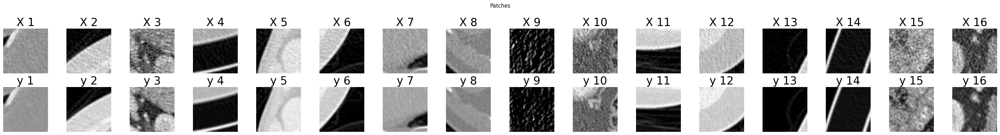

In [104]:
visualize_patches(X_train, y_train)

In [105]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [106]:
import torch
import torch.nn as nn

class RedCNN(nn.Module):
    def __init__(self):
        super(RedCNN, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)
        
        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()


    def forward(self, x):
        # 인코더 부분
        residual1 = x  # 첫 번째 잔차 저장
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x  # 두 번째 잔차 저장
        x = self.relu(self.conv3(x))
        x = self.relu(self.conv4(x))
        residual3 = x  # 세 번째 잔차 저장
        x = self.relu(self.conv5(x))
        
        # 디코더 부분 (잔차를 더해줌)
        x = self.relu(self.deconv1(x)) + residual3  # 세 번째 잔차 연결
        x = self.relu(self.deconv2(x))
        x = self.relu((self.deconv3(x)) + residual2)  # 두 번째 잔차 연결
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1  # 첫 번째 잔차 연결
        
        return x

In [107]:
model = RedCNN().to(device)

In [108]:
%cd /root

/root


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [109]:
import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [110]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

In [111]:
model_name = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}'
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), f"{model_name}.pth")
        print('model is saving...')

Epoch 0 - Training:   5%|▌         | 1008/18764 [00:12<03:43, 79.43it/s]

train loss : 0.006446053645107895


Epoch 0 - Training:  11%|█         | 2008/18764 [00:25<03:34, 77.97it/s]

train loss : 0.004338984579779208


Epoch 0 - Training:  16%|█▌        | 3008/18764 [00:38<03:22, 77.96it/s]

train loss : 0.003952379478607327


Epoch 0 - Training:  21%|██▏       | 4008/18764 [00:50<03:11, 76.95it/s]

train loss : 0.003705976224737242


Epoch 0 - Training:  27%|██▋       | 5008/18764 [01:03<02:58, 77.02it/s]

train loss : 0.0035922694485634567


Epoch 0 - Training:  32%|███▏      | 6008/18764 [01:16<02:51, 74.52it/s]

train loss : 0.003478000124916434


Epoch 0 - Training:  37%|███▋      | 7008/18764 [01:29<02:32, 76.92it/s]

train loss : 0.0034312633507652206


Epoch 0 - Training:  43%|████▎     | 8008/18764 [01:42<02:20, 76.77it/s]

train loss : 0.003304542991099879


Epoch 0 - Training:  48%|████▊     | 9008/18764 [01:55<02:07, 76.54it/s]

train loss : 0.0032162323107477278


Epoch 0 - Training:  53%|█████▎    | 10008/18764 [02:08<01:54, 76.51it/s]

train loss : 0.0032088503704871983


Epoch 0 - Training:  59%|█████▊    | 11008/18764 [02:21<01:40, 77.11it/s]

train loss : 0.0031326890072086826


Epoch 0 - Training:  64%|██████▍   | 12008/18764 [02:34<01:29, 75.66it/s]

train loss : 0.0031536948319990186


Epoch 0 - Training:  69%|██████▉   | 13008/18764 [02:47<01:15, 76.12it/s]

train loss : 0.0030419207765953614


Epoch 0 - Training:  75%|███████▍  | 14008/18764 [03:00<01:02, 76.37it/s]

train loss : 0.0030487503211479635


Epoch 0 - Training:  80%|███████▉  | 15008/18764 [03:13<00:49, 76.38it/s]

train loss : 0.0030787203921936452


Epoch 0 - Training:  85%|████████▌ | 16008/18764 [03:26<00:35, 77.01it/s]

train loss : 0.0029968142381403594


Epoch 0 - Training:  91%|█████████ | 17008/18764 [03:39<00:22, 77.00it/s]

train loss : 0.0029635568062076345


Epoch 0 - Training:  96%|█████████▌| 18008/18764 [03:52<00:09, 77.14it/s]

train loss : 0.002956011809874326


Epoch 0 - Evaluating:  65%|██████▍   | 1023/1580 [00:04<00:02, 219.19it/s]

train loss : 0.0019270920773269608


Epoch 0 - Evaluating: 100%|██████████| 1580/1580 [00:08<00:00, 187.06it/s]

Epoch [1/2], Train Loss: 0.0002, Valid Loss: 0.0001
model is saving...



Epoch 1 - Training:   5%|▌         | 1015/18764 [00:13<03:50, 76.98it/s]

train loss : 0.0029530551806092264


Epoch 1 - Training:  11%|█         | 2015/18764 [00:26<03:37, 76.99it/s]

train loss : 0.0029211674947291614


Epoch 1 - Training:  16%|█▌        | 3015/18764 [00:39<03:24, 77.09it/s]

train loss : 0.0029257265316555278


Epoch 1 - Training:  21%|██▏       | 4015/18764 [00:52<03:11, 76.85it/s]

train loss : 0.0028768471777439117


Epoch 1 - Training:  27%|██▋       | 5015/18764 [01:05<02:59, 76.61it/s]

train loss : 0.0028741338666295633


Epoch 1 - Training:  32%|███▏      | 6015/18764 [01:18<02:46, 76.39it/s]

train loss : 0.002846267514396459


Epoch 1 - Training:  37%|███▋      | 7015/18764 [01:31<02:32, 77.00it/s]

train loss : 0.0028159238833468407


Epoch 1 - Training:  43%|████▎     | 8015/18764 [01:44<02:20, 76.39it/s]

train loss : 0.002795366776525043


Epoch 1 - Training:  48%|████▊     | 9007/18764 [01:57<02:06, 76.91it/s]

train loss : 0.002832251941086724


Epoch 1 - Training:  53%|█████▎    | 10007/18764 [02:10<01:57, 74.71it/s]

train loss : 0.0028481504558585586


Epoch 1 - Training:  59%|█████▊    | 11015/18764 [02:23<01:40, 77.19it/s]

train loss : 0.002798455974087119


Epoch 1 - Training:  64%|██████▍   | 12015/18764 [02:36<01:28, 76.52it/s]

train loss : 0.0027554789793211966


Epoch 1 - Training:  69%|██████▉   | 13015/18764 [02:49<01:14, 77.00it/s]

train loss : 0.002769470569677651


Epoch 1 - Training:  75%|███████▍  | 14015/18764 [03:02<01:02, 76.29it/s]

train loss : 0.0027727847644127904


Epoch 1 - Training:  80%|████████  | 15015/18764 [03:15<00:48, 76.79it/s]

train loss : 0.0027686233283020557


Epoch 1 - Training:  85%|████████▌ | 16015/18764 [03:28<00:35, 76.59it/s]

train loss : 0.0027993411506759005


Epoch 1 - Training:  91%|█████████ | 17015/18764 [03:41<00:23, 75.96it/s]

train loss : 0.002752634435426444


Epoch 1 - Training:  96%|█████████▌| 18015/18764 [03:54<00:09, 76.69it/s]

train loss : 0.0027673001285875216


Epoch 1 - Evaluating:  65%|██████▍   | 1024/1580 [00:04<00:02, 216.18it/s]

train loss : 0.0018594542836362963


Epoch 1 - Evaluating: 100%|██████████| 1580/1580 [00:08<00:00, 188.58it/s]

Epoch [2/2], Train Loss: 0.0002, Valid Loss: 0.0001
model is saving...


In [112]:
!pwd

/root


In [113]:
%cd '/root/cluster/c{cluster_id}'

/root/cluster/c0


In [114]:
!pwd

/root/cluster/c0


In [115]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [116]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [117]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

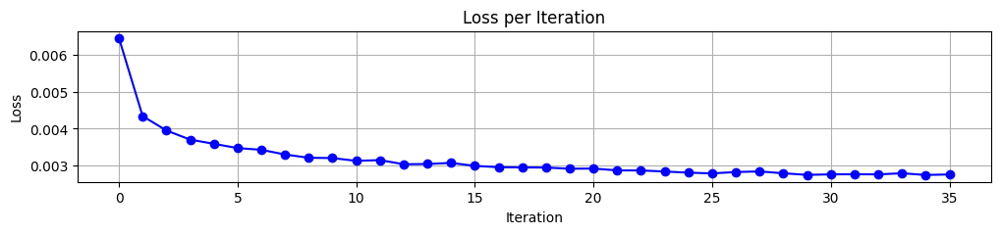

In [118]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

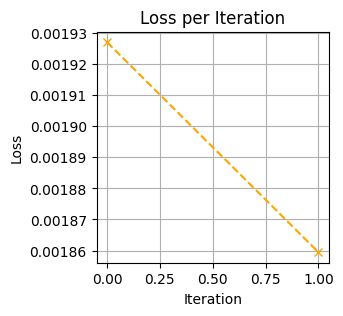

In [119]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

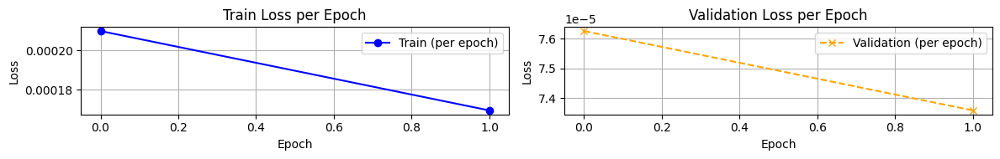

In [120]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

In [121]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [122]:
cluster_id = 0
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model_name = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}.pth'
model.load_state_dict(torch.load(model_name))

<All keys matched successfully>

In [123]:
test_path = f'/root/cluster/c{cluster_id}/test_dataset.pt'
test_dataset = torch.load(test_path)
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

391

In [124]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating: 100%|██████████| 391/391 [00:07<00:00, 54.74it/s]


In [125]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

def rescale(normalized_img, original_min=-1000, original_max=3000):
    """
    정규화된 이미지를 원래 HU 범위로 복원하는 함수

    :param normalized_img: 정규화된 이미지 (0~1)
    :param original_min: 원본 HU 최소값
    :param original_max: 원본 HU 최대값
    :return: 원래 HU 값으로 복원된 이미지
    """
    restored_img = normalized_img * (original_max - original_min) + original_min
    return restored_img

def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

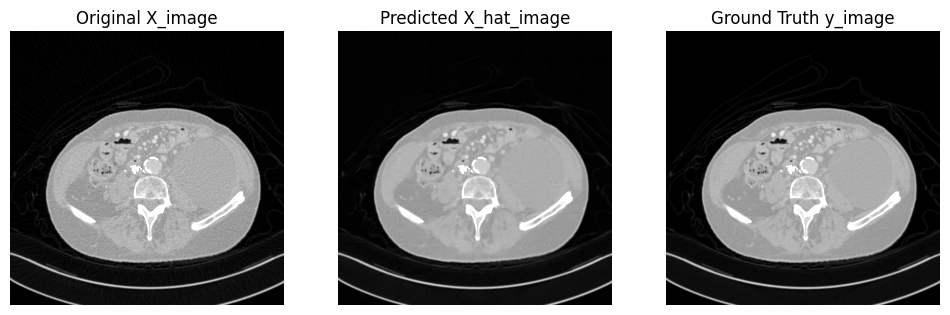

In [126]:
# 1. 가장 좋은 값 가져오기
X_test, y_test, X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'best')

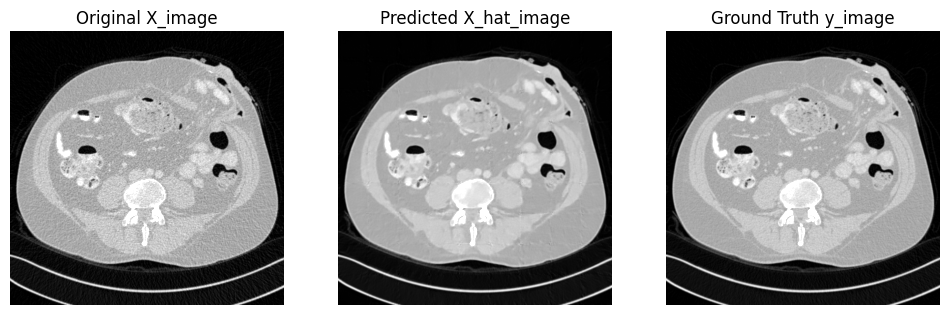

In [127]:
# 2. 가장 나쁜 값 가져오기
X_test, y_test, X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'worst')

In [128]:
# rmse, psnr, ssim 구하기

import torch
import torch.nn as nn
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from tqdm import tqdm

criterion = nn.MSELoss()
interval = 100

# 저장된 모델 로드
model_path = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model.load_state_dict(torch.load(model_path))

# 평가 지표 계산 추가
def calculate_psnr(y_true, y_pred):
    """PSNR 계산 함수"""
    y_true = y_true.cpu().numpy()
    y_pred = y_pred.cpu().numpy()
    return peak_signal_noise_ratio(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

def calculate_ssim(y_true, y_pred):
    """SSIM 계산 함수"""
    y_true = y_true.squeeze(0).cpu().numpy()
    y_pred = y_pred.squeeze(0).cpu().numpy()
    return structural_similarity(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

# evaluate 부분 + top10 best&worst
model.eval()
running_loss = 0.0
running_psnr = 0.0
running_ssim = 0.0
psnr_list = []
ssim_list = []
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        mse_loss = criterion(X_hat, y)

        # RMSE 계산
        rms_loss = torch.sqrt(mse_loss)
        running_loss += rms_loss.item()

        # PSNR, SSIM 계산
        for j in range(X.size(0)):  # 배치 내부 개별 이미지에 대해 계산
            psnr = calculate_psnr(y[j, :, :, :], X_hat[j, :, :, :])
            ssim = calculate_ssim(y[j, :, :, :], X_hat[j, :, :, :]) 
            running_psnr += psnr # batch에 대해 더해준다.
            running_ssim += ssim

        if mse_loss < best_loss:
            best_loss = mse_loss
            best = (X, y, X_hat)
        if mse_loss > worst_loss:
            worst_loss = mse_loss
            worst = (X, y, X_hat)

        if i % interval == interval - 1:
            interval_loss = running_loss / interval
            interval_psnr = running_psnr / (interval * X.size(0)) # batch에 대해 나눠준다
            interval_ssim = running_ssim / (interval * X.size(0))

            loss_list.append(interval_loss)
            psnr_list.append(interval_psnr)
            ssim_list.append(interval_ssim)

            total_loss += interval_loss
            running_loss = 0.0
            running_psnr = 0.0
            running_ssim = 0.0
            tqdm.write(f'RMSE per interval: {interval_loss:.4f}, PSNR per interval: {interval_psnr:.2f}, SSIM per interval: {interval_ssim:.4f}')
            # tqdm.write(f'RMSE per interval: {interval_loss}, PSNR per interval: {interval_psnr}, SSIM per interval: {interval_ssim}')

    # 평균 RMSE 출력
average_loss = total_loss / len(loss_list)
print(f"Average RMSE over all intervals: {average_loss:.6f}")

Evaluating:   0%|          | 0/391 [00:00<?, ?it/s]

Evaluating:  26%|██▌       | 102/391 [00:04<00:14, 20.50it/s]

RMSE per interval: 0.0090, PSNR per interval: 43.07, SSIM per interval: 0.9589


Evaluating:  52%|█████▏    | 204/391 [00:09<00:09, 20.39it/s]

RMSE per interval: 0.0109, PSNR per interval: 41.68, SSIM per interval: 0.9408


Evaluating:  77%|███████▋  | 303/391 [00:14<00:04, 20.40it/s]

RMSE per interval: 0.0114, PSNR per interval: 40.84, SSIM per interval: 0.9370


Evaluating: 100%|██████████| 391/391 [00:19<00:00, 20.46it/s]

Average RMSE over all intervals: 0.010409


In [129]:
import os
import numpy as np

s = f'/root/cluster/c{cluster_id}/metric/'

# 파일 저장 경로
file_names = {
    "loss": "loss_list.npy",
    "psnr": "psnr_list.npy",
    "ssim": "ssim_list.npy"
}

# 각 리스트를 저장
np.save(s+file_names["loss"], loss_list)
np.save(s+file_names["psnr"], psnr_list)
np.save(s+file_names["ssim"], ssim_list)

print(f"Lists have been saved in the {s} folder:\n- {file_names['loss']}\n- {file_names['psnr']}\n- {file_names['ssim']}")

Lists have been saved in the /root/cluster/c0/metric/ folder:
- loss_list.npy
- psnr_list.npy
- ssim_list.npy


### 클러스터 1 모델 학습

In [130]:
cluster_id = 1
epochs = 2

In [131]:
# 데이터셋 불러오기

patch_folder = f"/root/cluster/c{cluster_id}/"
train_path = patch_folder+'train_dataset.pt'
val_path = patch_folder+'val_dataset.pt'
test_path = patch_folder+'test_dataset.pt'

train_dataset = torch.load(train_path)
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path)

In [132]:
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)

len(train_loader), len(val_loader), len(test_loader)

(24763, 2086, 2613)

In [133]:
X_train, y_train = next(iter(train_loader))
X_train.shape, y_train.shape

(torch.Size([16, 1, 55, 55]), torch.Size([16, 1, 55, 55]))

In [134]:
def visualize_patches(X, y):
    fig, axes = plt.subplots(2, 16, figsize=(32, 4))  # 2행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(np.squeeze(X[i]), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=25)
        
        # y 데이터 시각화
        axes[1, i].imshow(np.squeeze(y[i]), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=25)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # 제목 위치 조정
    plt.show()

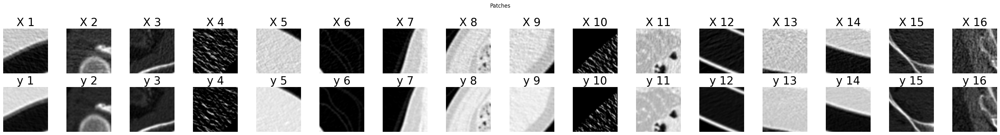

In [135]:
visualize_patches(X_train, y_train)

In [136]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [137]:
import torch
import torch.nn as nn

class RedCNN(nn.Module):
    def __init__(self):
        super(RedCNN, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)
        
        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()


    def forward(self, x):
        # 인코더 부분
        residual1 = x  # 첫 번째 잔차 저장
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x  # 두 번째 잔차 저장
        x = self.relu(self.conv3(x))
        x = self.relu(self.conv4(x))
        residual3 = x  # 세 번째 잔차 저장
        x = self.relu(self.conv5(x))
        
        # 디코더 부분 (잔차를 더해줌)
        x = self.relu(self.deconv1(x)) + residual3  # 세 번째 잔차 연결
        x = self.relu(self.deconv2(x))
        x = self.relu((self.deconv3(x)) + residual2)  # 두 번째 잔차 연결
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1  # 첫 번째 잔차 연결
        
        return x

In [138]:
model = RedCNN().to(device)

In [139]:
%cd /root

/root


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [140]:
import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [141]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

In [142]:
model_name = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}'
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), f"{model_name}.pth")
        
        print('model is saving...')

Epoch 0 - Training:   4%|▍         | 1008/24763 [00:12<05:01, 78.83it/s]

train loss : 0.01303130117780529


Epoch 0 - Training:   8%|▊         | 2008/24763 [00:25<04:51, 77.99it/s]

train loss : 0.004086523873033002


Epoch 0 - Training:  12%|█▏        | 3008/24763 [00:38<04:39, 77.85it/s]

train loss : 0.0031632904196158052


Epoch 0 - Training:  16%|█▌        | 4008/24763 [00:51<04:27, 77.72it/s]

train loss : 0.002831554115167819


Epoch 0 - Training:  20%|██        | 5008/24763 [01:03<04:13, 77.95it/s]

train loss : 0.0025931117502623236


Epoch 0 - Training:  24%|██▍       | 6008/24763 [01:16<04:02, 77.27it/s]

train loss : 0.0024752228645374998


Epoch 0 - Training:  28%|██▊       | 7008/24763 [01:29<03:48, 77.70it/s]

train loss : 0.002380715156963561


Epoch 0 - Training:  32%|███▏      | 8008/24763 [01:42<03:36, 77.27it/s]

train loss : 0.002272196443693247


Epoch 0 - Training:  36%|███▋      | 9008/24763 [01:55<03:23, 77.45it/s]

train loss : 0.002198356540175155


Epoch 0 - Training:  40%|████      | 10008/24763 [02:08<03:10, 77.26it/s]

train loss : 0.002129544648400042


Epoch 0 - Training:  44%|████▍     | 11008/24763 [02:21<02:58, 77.09it/s]

train loss : 0.0021460319787147456


Epoch 0 - Training:  48%|████▊     | 12008/24763 [02:34<02:45, 76.88it/s]

train loss : 0.0021369026979082264


Epoch 0 - Training:  53%|█████▎    | 13008/24763 [02:47<02:34, 76.20it/s]

train loss : 0.002104240232729353


Epoch 0 - Training:  57%|█████▋    | 14008/24763 [03:00<02:19, 77.22it/s]

train loss : 0.0020225666940095833


Epoch 0 - Training:  61%|██████    | 15008/24763 [03:13<02:06, 77.20it/s]

train loss : 0.002043401659815572


Epoch 0 - Training:  65%|██████▍   | 16008/24763 [03:26<01:53, 77.11it/s]

train loss : 0.002017683240759652


Epoch 0 - Training:  69%|██████▊   | 17008/24763 [03:39<01:40, 77.18it/s]

train loss : 0.00200055444490863


Epoch 0 - Training:  73%|███████▎  | 18008/24763 [03:52<01:28, 76.32it/s]

train loss : 0.0019555953418312127


Epoch 0 - Training:  77%|███████▋  | 19008/24763 [04:05<01:14, 77.04it/s]

train loss : 0.001958387644495815


Epoch 0 - Training:  81%|████████  | 20008/24763 [04:18<01:02, 75.61it/s]

train loss : 0.0019269441338256002


Epoch 0 - Training:  85%|████████▍ | 21008/24763 [04:31<00:48, 76.89it/s]

train loss : 0.0019765806809300557


Epoch 0 - Training:  89%|████████▉ | 22008/24763 [04:44<00:35, 77.33it/s]

train loss : 0.001941179189248942


Epoch 0 - Training:  93%|█████████▎| 23008/24763 [04:56<00:22, 76.97it/s]

train loss : 0.0019315015796455555


Epoch 0 - Training:  97%|█████████▋| 24008/24763 [05:09<00:09, 76.18it/s]

train loss : 0.0019091709346394055


Epoch 0 - Evaluating:  49%|████▉     | 1030/2086 [00:04<00:04, 218.90it/s]

train loss : 0.0017388348383319682


Epoch 0 - Evaluating:  97%|█████████▋| 2027/2086 [00:09<00:00, 218.99it/s]

train loss : 0.0015544603883754463


Epoch 0 - Evaluating: 100%|██████████| 2086/2086 [00:10<00:00, 193.67it/s]

Epoch [1/2], Train Loss: 0.0002, Valid Loss: 0.0001
model is saving...



Epoch 1 - Training:   4%|▍         | 1008/24763 [00:13<05:08, 77.10it/s]

train loss : 0.001886508034192957


Epoch 1 - Training:   8%|▊         | 2008/24763 [00:25<04:59, 75.91it/s]

train loss : 0.0018515464559895917


Epoch 1 - Training:  12%|█▏        | 3008/24763 [00:38<04:41, 77.32it/s]

train loss : 0.0018749598807189613


Epoch 1 - Training:  16%|█▌        | 4008/24763 [00:51<04:33, 75.97it/s]

train loss : 0.0018824063927750103


Epoch 1 - Training:  20%|██        | 5008/24763 [01:04<04:18, 76.56it/s]

train loss : 0.0019061613020603546


Epoch 1 - Training:  24%|██▍       | 6008/24763 [01:17<04:03, 76.94it/s]

train loss : 0.0018802142204949633


Epoch 1 - Training:  28%|██▊       | 7008/24763 [01:30<03:50, 77.18it/s]

train loss : 0.0018285364985931665


Epoch 1 - Training:  32%|███▏      | 8008/24763 [01:43<03:37, 77.19it/s]

train loss : 0.0017969804835738614


Epoch 1 - Training:  36%|███▋      | 9008/24763 [01:56<03:25, 76.63it/s]

train loss : 0.001827830852183979


Epoch 1 - Training:  40%|████      | 10008/24763 [02:09<03:11, 76.87it/s]

train loss : 0.001777312310936395


Epoch 1 - Training:  44%|████▍     | 11008/24763 [02:22<02:59, 76.76it/s]

train loss : 0.0018040173651534134


Epoch 1 - Training:  48%|████▊     | 12008/24763 [02:35<02:45, 77.16it/s]

train loss : 0.0017991501939250156


Epoch 1 - Training:  53%|█████▎    | 13008/24763 [02:48<02:35, 75.68it/s]

train loss : 0.0017892675162875093


Epoch 1 - Training:  57%|█████▋    | 14008/24763 [03:01<02:19, 77.22it/s]

train loss : 0.0018093859266955406


Epoch 1 - Training:  61%|██████    | 15008/24763 [03:14<02:06, 76.91it/s]

train loss : 0.0017333614997914993


Epoch 1 - Training:  65%|██████▍   | 16008/24763 [03:27<01:53, 77.14it/s]

train loss : 0.0017433528235997074


Epoch 1 - Training:  69%|██████▊   | 17008/24763 [03:40<01:41, 76.56it/s]

train loss : 0.001765688678191509


Epoch 1 - Training:  73%|███████▎  | 18008/24763 [03:53<01:27, 77.12it/s]

train loss : 0.0017590181568521075


Epoch 1 - Training:  77%|███████▋  | 19008/24763 [04:06<01:15, 76.62it/s]

train loss : 0.0017314743478782475


Epoch 1 - Training:  81%|████████  | 20008/24763 [04:19<01:02, 76.20it/s]

train loss : 0.0017593306617345662


Epoch 1 - Training:  85%|████████▍ | 21008/24763 [04:32<00:49, 76.52it/s]

train loss : 0.0017324131854693405


Epoch 1 - Training:  89%|████████▉ | 22008/24763 [04:45<00:35, 77.50it/s]

train loss : 0.0017606969567132182


Epoch 1 - Training:  93%|█████████▎| 23008/24763 [04:58<00:23, 75.59it/s]

train loss : 0.0017188543204392772


Epoch 1 - Training:  97%|█████████▋| 24008/24763 [05:11<00:09, 77.00it/s]

train loss : 0.0017196434972574935


Epoch 1 - Evaluating:  50%|████▉     | 1034/2086 [00:04<00:04, 218.53it/s]

train loss : 0.001632334466019529


Epoch 1 - Evaluating:  97%|█████████▋| 2026/2086 [00:09<00:00, 218.22it/s]

train loss : 0.0014535812601607176


Epoch 1 - Evaluating: 100%|██████████| 2086/2086 [00:10<00:00, 201.39it/s]

Epoch [2/2], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...


In [143]:
!pwd

/root


In [144]:
%cd '/root/cluster/c{cluster_id}'

/root/cluster/c1


In [145]:
!pwd

/root/cluster/c1


In [146]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [147]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [148]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

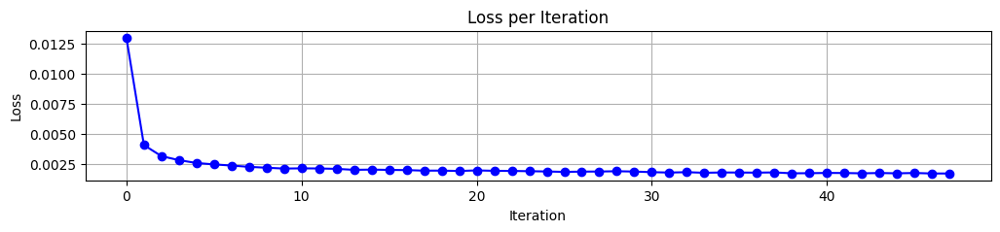

In [149]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

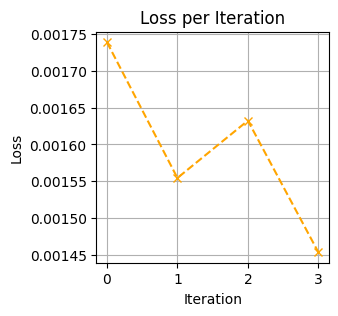

In [150]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

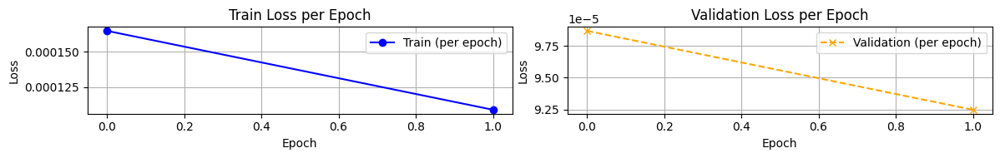

In [151]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

In [152]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [153]:
cluster_id = 1
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model_name = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}.pth'
model.load_state_dict(torch.load(model_name))

<All keys matched successfully>

In [154]:
test_path = f'/root/cluster/c{cluster_id}/test_dataset.pt'
test_dataset = torch.load(test_path)
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

516

In [155]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating: 100%|██████████| 516/516 [00:09<00:00, 55.82it/s]


In [156]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

def rescale(normalized_img, original_min=-1000, original_max=3000):
    """
    정규화된 이미지를 원래 HU 범위로 복원하는 함수

    :param normalized_img: 정규화된 이미지 (0~1)
    :param original_min: 원본 HU 최소값
    :param original_max: 원본 HU 최대값
    :return: 원래 HU 값으로 복원된 이미지
    """
    restored_img = normalized_img * (original_max - original_min) + original_min
    return restored_img

def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

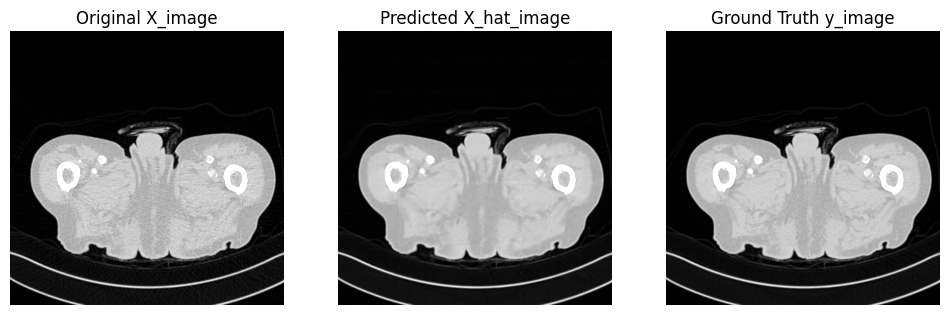

In [157]:
# 1. 가장 좋은 값 가져오기
X_test, y_test, X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'best')

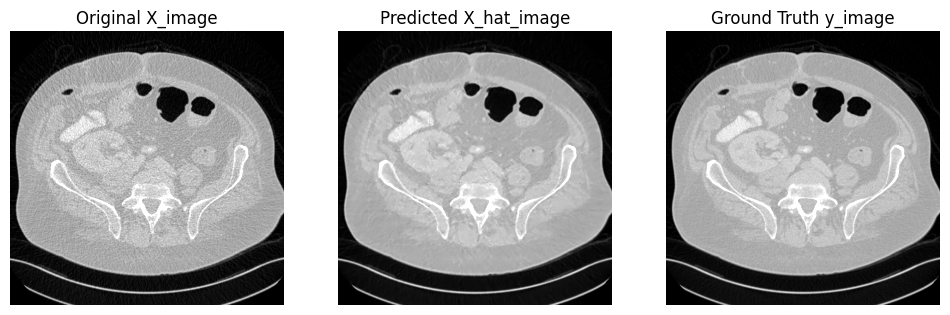

In [158]:
# 2. 가장 나쁜 값 가져오기
X_test, y_test, X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'worst')

In [159]:
# rmse, psnr, ssim 구하기

import torch
import torch.nn as nn
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from tqdm import tqdm

criterion = nn.MSELoss()
interval = 100

# 저장된 모델 로드
model_path = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model.load_state_dict(torch.load(model_path))

# 평가 지표 계산 추가
def calculate_psnr(y_true, y_pred):
    """PSNR 계산 함수"""
    y_true = y_true.cpu().numpy()
    y_pred = y_pred.cpu().numpy()
    return peak_signal_noise_ratio(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

def calculate_ssim(y_true, y_pred):
    """SSIM 계산 함수"""
    y_true = y_true.squeeze(0).cpu().numpy()
    y_pred = y_pred.squeeze(0).cpu().numpy()
    return structural_similarity(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

# evaluate 부분 + top10 best&worst
model.eval()
running_loss = 0.0
running_psnr = 0.0
running_ssim = 0.0
psnr_list = []
ssim_list = []
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        mse_loss = criterion(X_hat, y)

        # RMSE 계산
        rms_loss = torch.sqrt(mse_loss)
        running_loss += rms_loss.item()

        # PSNR, SSIM 계산
        for j in range(X.size(0)):  # 배치 내부 개별 이미지에 대해 계산
            psnr = calculate_psnr(y[j, :, :, :], X_hat[j, :, :, :])
            ssim = calculate_ssim(y[j, :, :, :], X_hat[j, :, :, :]) 
            running_psnr += psnr # batch에 대해 더해준다.
            running_ssim += ssim

        if mse_loss < best_loss:
            best_loss = mse_loss
            best = (X, y, X_hat)
        if mse_loss > worst_loss:
            worst_loss = mse_loss
            worst = (X, y, X_hat)

        if i % interval == interval - 1:
            interval_loss = running_loss / interval
            interval_psnr = running_psnr / (interval * X.size(0)) # batch에 대해 나눠준다
            interval_ssim = running_ssim / (interval * X.size(0))

            loss_list.append(interval_loss)
            psnr_list.append(interval_psnr)
            ssim_list.append(interval_ssim)

            total_loss += interval_loss
            running_loss = 0.0
            running_psnr = 0.0
            running_ssim = 0.0
            tqdm.write(f'RMSE per interval: {interval_loss:.4f}, PSNR per interval: {interval_psnr:.2f}, SSIM per interval: {interval_ssim:.4f}')
            # tqdm.write(f'RMSE per interval: {interval_loss}, PSNR per interval: {interval_psnr}, SSIM per interval: {interval_ssim}')

    # 평균 RMSE 출력
average_loss = total_loss / len(loss_list)
print(f"Average RMSE over all intervals: {average_loss:.6f}")

Evaluating:   1%|          | 3/516 [00:00<00:25, 20.33it/s]

Evaluating:  20%|█▉        | 102/516 [00:05<00:20, 20.11it/s]

RMSE per interval: 0.0109, PSNR per interval: 41.16, SSIM per interval: 0.9464


Evaluating:  40%|███▉      | 204/516 [00:10<00:15, 20.15it/s]

RMSE per interval: 0.0100, PSNR per interval: 42.80, SSIM per interval: 0.9514


Evaluating:  59%|█████▊    | 303/516 [00:14<00:10, 20.34it/s]

RMSE per interval: 0.0091, PSNR per interval: 43.04, SSIM per interval: 0.9583


Evaluating:  78%|███████▊  | 402/516 [00:19<00:05, 20.19it/s]

RMSE per interval: 0.0090, PSNR per interval: 43.32, SSIM per interval: 0.9572


Evaluating:  98%|█████████▊| 504/516 [00:24<00:00, 20.23it/s]

RMSE per interval: 0.0083, PSNR per interval: 44.76, SSIM per interval: 0.9665


Evaluating: 100%|██████████| 516/516 [00:25<00:00, 20.25it/s]

Average RMSE over all intervals: 0.009451


In [160]:
import os
import numpy as np

s = f'/root/cluster/c{cluster_id}/metric/'

# 파일 저장 경로
file_names = {
    "loss": "loss_list.npy",
    "psnr": "psnr_list.npy",
    "ssim": "ssim_list.npy"
}

# 각 리스트를 저장
np.save(s+file_names["loss"], loss_list)
np.save(s+file_names["psnr"], psnr_list)
np.save(s+file_names["ssim"], ssim_list)

print(f"Lists have been saved in the {s} folder:\n- {file_names['loss']}\n- {file_names['psnr']}\n- {file_names['ssim']}")

Lists have been saved in the /root/cluster/c1/metric/ folder:
- loss_list.npy
- psnr_list.npy
- ssim_list.npy


### 클러스터 2 모델 학습

In [161]:
cluster_id = 2
epochs = 8

In [162]:
# 데이터셋 불러오기

patch_folder = f"/root/cluster/c{cluster_id}/"
train_path = patch_folder+'train_dataset.pt'
val_path = patch_folder+'val_dataset.pt'
test_path = patch_folder+'test_dataset.pt'

train_dataset = torch.load(train_path)
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path)

In [163]:
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)

len(train_loader), len(val_loader), len(test_loader)

(13901, 1160, 1484)

In [164]:
X_train, y_train = next(iter(train_loader))
X_train.shape, y_train.shape

(torch.Size([16, 1, 55, 55]), torch.Size([16, 1, 55, 55]))

In [165]:
def visualize_patches(X, y):
    fig, axes = plt.subplots(2, 16, figsize=(32, 4))  # 2행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(np.squeeze(X[i]), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=25)
        
        # y 데이터 시각화
        axes[1, i].imshow(np.squeeze(y[i]), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=25)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # 제목 위치 조정
    plt.show()

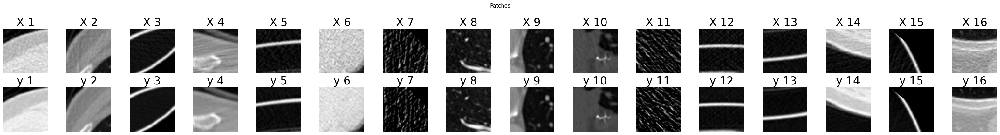

In [166]:
visualize_patches(X_train, y_train)

In [167]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [168]:
import torch
import torch.nn as nn

class RedCNN(nn.Module):
    def __init__(self):
        super(RedCNN, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)
        
        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()


    def forward(self, x):
        # 인코더 부분
        residual1 = x  # 첫 번째 잔차 저장
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x  # 두 번째 잔차 저장
        x = self.relu(self.conv3(x))
        x = self.relu(self.conv4(x))
        residual3 = x  # 세 번째 잔차 저장
        x = self.relu(self.conv5(x))
        
        # 디코더 부분 (잔차를 더해줌)
        x = self.relu(self.deconv1(x)) + residual3  # 세 번째 잔차 연결
        x = self.relu(self.deconv2(x))
        x = self.relu((self.deconv3(x)) + residual2)  # 두 번째 잔차 연결
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1  # 첫 번째 잔차 연결
        
        return x

In [169]:
model = RedCNN().to(device)

In [170]:
%cd /root

/root


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [171]:
import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [172]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

In [173]:
model_name = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}'
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), f"{model_name}.pth")
        
        print('model is saving...')

Epoch 0 - Training:   7%|▋         | 1015/13901 [00:12<02:44, 78.21it/s]

train loss : 0.0054536633170209825


Epoch 0 - Training:  14%|█▍        | 2015/13901 [00:25<02:33, 77.31it/s]

train loss : 0.0033625494244042785


Epoch 0 - Training:  22%|██▏       | 3015/13901 [00:38<02:21, 76.89it/s]

train loss : 0.002928412488428876


Epoch 0 - Training:  29%|██▉       | 4015/13901 [00:51<02:08, 76.88it/s]

train loss : 0.002753940055146813


Epoch 0 - Training:  36%|███▌      | 5015/13901 [01:04<01:55, 77.13it/s]

train loss : 0.0026283228789689018


Epoch 0 - Training:  43%|████▎     | 6015/13901 [01:17<01:42, 77.08it/s]

train loss : 0.0025475517903687434


Epoch 0 - Training:  50%|█████     | 7015/13901 [01:30<01:29, 76.59it/s]

train loss : 0.0024081128683756106


Epoch 0 - Training:  58%|█████▊    | 8015/13901 [01:43<01:16, 76.85it/s]

train loss : 0.002399558961566072


Epoch 0 - Training:  65%|██████▍   | 9015/13901 [01:56<01:03, 76.56it/s]

train loss : 0.0023053099091630428


Epoch 0 - Training:  72%|███████▏  | 10015/13901 [02:09<00:50, 77.20it/s]

train loss : 0.002335941764060408


Epoch 0 - Training:  79%|███████▉  | 11015/13901 [02:22<00:37, 77.07it/s]

train loss : 0.002269184632692486


Epoch 0 - Training:  86%|████████▋ | 12015/13901 [02:35<00:24, 76.67it/s]

train loss : 0.0021681972108781337


Epoch 0 - Training:  94%|█████████▎| 13015/13901 [02:48<00:11, 76.72it/s]

train loss : 0.002205262100964319


Epoch 0 - Evaluating:  90%|████████▉ | 1039/1160 [00:04<00:00, 214.50it/s]

train loss : 0.0020467425492824987


Epoch 0 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 185.81it/s]

Epoch [1/8], Train Loss: 0.0002, Valid Loss: 0.0001
model is saving...



Epoch 1 - Training:   7%|▋         | 1008/13901 [00:12<02:46, 77.52it/s]

train loss : 0.002193011278985068


Epoch 1 - Training:  14%|█▍        | 2008/13901 [00:25<02:33, 77.45it/s]

train loss : 0.0021225453049410134


Epoch 1 - Training:  22%|██▏       | 3008/13901 [00:38<02:20, 77.34it/s]

train loss : 0.002108998455514666


Epoch 1 - Training:  29%|██▉       | 4008/13901 [00:51<02:08, 77.04it/s]

train loss : 0.002096495489240624


Epoch 1 - Training:  36%|███▌      | 5008/13901 [01:04<01:55, 77.09it/s]

train loss : 0.0020900954281678425


Epoch 1 - Training:  43%|████▎     | 6008/13901 [01:17<01:42, 77.06it/s]

train loss : 0.002084237376227975


Epoch 1 - Training:  50%|█████     | 7008/13901 [01:30<01:29, 77.12it/s]

train loss : 0.0020727595490170644


Epoch 1 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 76.59it/s]

train loss : 0.002054650477541145


Epoch 1 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 77.06it/s]

train loss : 0.0020453639995539562


Epoch 1 - Training:  72%|███████▏  | 10008/13901 [02:09<00:50, 76.94it/s]

train loss : 0.0019862638862105085


Epoch 1 - Training:  79%|███████▉  | 11008/13901 [02:22<00:37, 77.08it/s]

train loss : 0.002024316782306414


Epoch 1 - Training:  86%|████████▋ | 12008/13901 [02:35<00:24, 76.94it/s]

train loss : 0.0019830313010606917


Epoch 1 - Training:  94%|█████████▎| 13008/13901 [02:48<00:11, 77.21it/s]

train loss : 0.0020310244520078415


Epoch 1 - Evaluating:  89%|████████▊ | 1028/1160 [00:04<00:00, 217.83it/s]

train loss : 0.001878283219106379


Epoch 1 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 189.57it/s]

Epoch [2/8], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...



Epoch 2 - Training:   7%|▋         | 1008/13901 [00:13<02:47, 76.81it/s]

train loss : 0.001966916245757602


Epoch 2 - Training:  14%|█▍        | 2008/13901 [00:26<02:34, 76.91it/s]

train loss : 0.0019770208543050103


Epoch 2 - Training:  22%|██▏       | 3008/13901 [00:38<02:22, 76.24it/s]

train loss : 0.001964112498855684


Epoch 2 - Training:  29%|██▉       | 4008/13901 [00:51<02:09, 76.47it/s]

train loss : 0.0019825307308346963


Epoch 2 - Training:  36%|███▌      | 5008/13901 [01:04<01:56, 76.50it/s]

train loss : 0.0019392902472172863


Epoch 2 - Training:  43%|████▎     | 6008/13901 [01:17<01:42, 76.68it/s]

train loss : 0.0019528598241158762


Epoch 2 - Training:  50%|█████     | 7008/13901 [01:30<01:29, 76.69it/s]

train loss : 0.0019314063078491018


Epoch 2 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 76.76it/s]

train loss : 0.0019209587498917244


Epoch 2 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 76.68it/s]

train loss : 0.0019535944165545516


Epoch 2 - Training:  72%|███████▏  | 10008/13901 [02:09<00:50, 76.62it/s]

train loss : 0.0018826684695668519


Epoch 2 - Training:  79%|███████▉  | 11008/13901 [02:22<00:37, 77.03it/s]

train loss : 0.0019248690825188534


Epoch 2 - Training:  86%|████████▋ | 12008/13901 [02:35<00:24, 76.44it/s]

train loss : 0.001927659253764432


Epoch 2 - Training:  94%|█████████▎| 13008/13901 [02:48<00:11, 76.62it/s]

train loss : 0.0019132450233446433


Epoch 2 - Evaluating:  89%|████████▉ | 1036/1160 [00:04<00:00, 218.95it/s]

train loss : 0.0018532416293382994


Epoch 2 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 190.53it/s]

Epoch [3/8], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...



Epoch 3 - Training:   7%|▋         | 1008/13901 [00:12<02:46, 77.49it/s]

train loss : 0.001934184057638049


Epoch 3 - Training:  14%|█▍        | 2008/13901 [00:25<02:34, 76.94it/s]

train loss : 0.001883001170877833


Epoch 3 - Training:  22%|██▏       | 3008/13901 [00:38<02:20, 77.32it/s]

train loss : 0.0018785175097873435


Epoch 3 - Training:  29%|██▉       | 4008/13901 [00:51<02:07, 77.67it/s]

train loss : 0.0018890701640630141


Epoch 3 - Training:  36%|███▌      | 5008/13901 [01:04<01:54, 77.43it/s]

train loss : 0.0018642024448490703


Epoch 3 - Training:  43%|████▎     | 6008/13901 [01:17<01:42, 76.95it/s]

train loss : 0.0018303362398291937


Epoch 3 - Training:  50%|█████     | 7008/13901 [01:30<01:29, 76.79it/s]

train loss : 0.0018348577645374462


Epoch 3 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 76.96it/s]

train loss : 0.0018904429835383781


Epoch 3 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 77.07it/s]

train loss : 0.0018945290806004777


Epoch 3 - Training:  72%|███████▏  | 10008/13901 [02:09<00:50, 77.00it/s]

train loss : 0.0018635696953278966


Epoch 3 - Training:  79%|███████▉  | 11008/13901 [02:22<00:37, 76.87it/s]

train loss : 0.0018435387401841581


Epoch 3 - Training:  86%|████████▋ | 12008/13901 [02:35<00:24, 76.63it/s]

train loss : 0.0018252362158964388


Epoch 3 - Training:  94%|█████████▎| 13008/13901 [02:48<00:11, 76.89it/s]

train loss : 0.0019087251672171989


Epoch 3 - Evaluating:  90%|████████▉ | 1041/1160 [00:04<00:00, 218.58it/s]

train loss : 0.0018206795490332296


Epoch 3 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 188.05it/s]

Epoch [4/8], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...



Epoch 4 - Training:   7%|▋         | 1008/13901 [00:12<02:46, 77.65it/s]

train loss : 0.001862773970759008


Epoch 4 - Training:  14%|█▍        | 2008/13901 [00:25<02:33, 77.68it/s]

train loss : 0.001837568907008972


Epoch 4 - Training:  22%|██▏       | 3008/13901 [00:38<02:20, 77.46it/s]

train loss : 0.0018212290405645035


Epoch 4 - Training:  29%|██▉       | 4008/13901 [00:51<02:08, 77.05it/s]

train loss : 0.001814275993499905


Epoch 4 - Training:  36%|███▌      | 5008/13901 [01:04<01:55, 76.95it/s]

train loss : 0.001852700304123573


Epoch 4 - Training:  43%|████▎     | 6008/13901 [01:17<01:42, 77.06it/s]

train loss : 0.0018529447828768753


Epoch 4 - Training:  50%|█████     | 7008/13901 [01:30<01:29, 77.41it/s]

train loss : 0.0018162658341461793


Epoch 4 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 77.50it/s]

train loss : 0.0018286193967796862


Epoch 4 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 77.02it/s]

train loss : 0.0018485369767877273


Epoch 4 - Training:  72%|███████▏  | 10008/13901 [02:09<00:50, 76.76it/s]

train loss : 0.0018155050011118873


Epoch 4 - Training:  79%|███████▉  | 11008/13901 [02:22<00:37, 76.67it/s]

train loss : 0.0018349926259252243


Epoch 4 - Training:  86%|████████▋ | 12008/13901 [02:35<00:24, 76.59it/s]

train loss : 0.0018065428278641776


Epoch 4 - Training:  94%|█████████▎| 13008/13901 [02:48<00:11, 76.74it/s]

train loss : 0.001801474982581567


Epoch 4 - Evaluating:  89%|████████▉ | 1034/1160 [00:04<00:00, 216.87it/s]

train loss : 0.001824526146861899


Epoch 4 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 186.89it/s]

Epoch [5/8], Train Loss: 0.0001, Valid Loss: 0.0001



Epoch 5 - Training:   7%|▋         | 1008/13901 [00:12<02:46, 77.54it/s]

train loss : 0.0018305266151437535


Epoch 5 - Training:  14%|█▍        | 2008/13901 [00:25<02:34, 77.06it/s]

train loss : 0.001816889396024635


Epoch 5 - Training:  22%|██▏       | 3008/13901 [00:38<02:22, 76.62it/s]

train loss : 0.0017960477107553743


Epoch 5 - Training:  29%|██▉       | 4008/13901 [00:51<02:08, 77.23it/s]

train loss : 0.001813544964126777


Epoch 5 - Training:  36%|███▌      | 5008/13901 [01:04<01:55, 77.28it/s]

train loss : 0.0018214721598196774


Epoch 5 - Training:  43%|████▎     | 6008/13901 [01:17<01:42, 77.24it/s]

train loss : 0.0018208528475370258


Epoch 5 - Training:  50%|█████     | 7008/13901 [01:30<01:30, 76.25it/s]

train loss : 0.001789635943248868


Epoch 5 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 76.63it/s]

train loss : 0.001812269667047076


Epoch 5 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 76.59it/s]

train loss : 0.0017879028245224617


Epoch 5 - Training:  72%|███████▏  | 10008/13901 [02:09<00:50, 76.99it/s]

train loss : 0.0017583442069008014


Epoch 5 - Training:  79%|███████▉  | 11008/13901 [02:22<00:37, 76.83it/s]

train loss : 0.001785486733133439


Epoch 5 - Training:  86%|████████▋ | 12008/13901 [02:35<00:24, 76.88it/s]

train loss : 0.0017602172561455517


Epoch 5 - Training:  94%|█████████▎| 13008/13901 [02:48<00:11, 77.19it/s]

train loss : 0.0017935555137810297


Epoch 5 - Evaluating:  89%|████████▊ | 1027/1160 [00:04<00:00, 219.24it/s]

train loss : 0.0017619576443976257


Epoch 5 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 190.12it/s]

Epoch [6/8], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...



Epoch 6 - Training:   7%|▋         | 1008/13901 [00:12<02:46, 77.37it/s]

train loss : 0.0017822499939939007


Epoch 6 - Training:  14%|█▍        | 2008/13901 [00:25<02:33, 77.51it/s]

train loss : 0.0017586201324011198


Epoch 6 - Training:  22%|██▏       | 3008/13901 [00:38<02:20, 77.55it/s]

train loss : 0.0017572599376435391


Epoch 6 - Training:  29%|██▉       | 4008/13901 [00:51<02:07, 77.36it/s]

train loss : 0.001777781945769675


Epoch 6 - Training:  36%|███▌      | 5008/13901 [01:04<01:54, 77.37it/s]

train loss : 0.0017714702113880776


Epoch 6 - Training:  43%|████▎     | 6008/13901 [01:17<01:42, 77.15it/s]

train loss : 0.0017970913478638976


Epoch 6 - Training:  50%|█████     | 7008/13901 [01:30<01:29, 77.21it/s]

train loss : 0.0018022066744742915


Epoch 6 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 77.26it/s]

train loss : 0.0017644857926643453


Epoch 6 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 77.19it/s]

train loss : 0.0017674231054843404


Epoch 6 - Training:  72%|███████▏  | 10008/13901 [02:09<00:50, 77.15it/s]

train loss : 0.0017837751278420911


Epoch 6 - Training:  79%|███████▉  | 11008/13901 [02:22<00:37, 77.22it/s]

train loss : 0.0017617884690407663


Epoch 6 - Training:  86%|████████▋ | 12008/13901 [02:34<00:24, 77.24it/s]

train loss : 0.0017708367593586446


Epoch 6 - Training:  94%|█████████▎| 13008/13901 [02:47<00:11, 77.18it/s]

train loss : 0.0017580793088418432


Epoch 6 - Evaluating:  88%|████████▊ | 1022/1160 [00:04<00:00, 217.15it/s]

train loss : 0.0017582846881632576


Epoch 6 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 190.09it/s]

Epoch [7/8], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...



Epoch 7 - Training:   7%|▋         | 1008/13901 [00:12<02:45, 77.90it/s]

train loss : 0.0017607879880815744


Epoch 7 - Training:  14%|█▍        | 2008/13901 [00:25<02:33, 77.45it/s]

train loss : 0.0017497718925587832


Epoch 7 - Training:  22%|██▏       | 3008/13901 [00:38<02:20, 77.49it/s]

train loss : 0.0017576705393148586


Epoch 7 - Training:  29%|██▉       | 4008/13901 [00:51<02:08, 77.07it/s]

train loss : 0.0017575111400219613


Epoch 7 - Training:  36%|███▌      | 5008/13901 [01:04<01:54, 77.38it/s]

train loss : 0.001783684901194647


Epoch 7 - Training:  43%|████▎     | 6008/13901 [01:17<01:41, 77.50it/s]

train loss : 0.001746009741560556


Epoch 7 - Training:  50%|█████     | 7008/13901 [01:30<01:28, 77.50it/s]

train loss : 0.0017208117535628844


Epoch 7 - Training:  58%|█████▊    | 8008/13901 [01:43<01:16, 77.50it/s]

train loss : 0.0017733890645904467


Epoch 7 - Training:  65%|██████▍   | 9008/13901 [01:56<01:03, 77.48it/s]

train loss : 0.0017494741322589106


Epoch 7 - Training:  72%|███████▏  | 10008/13901 [02:08<00:50, 77.34it/s]

train loss : 0.0017702539884485303


Epoch 7 - Training:  79%|███████▉  | 11008/13901 [02:21<00:37, 77.54it/s]

train loss : 0.0017690254093613476


Epoch 7 - Training:  86%|████████▋ | 12008/13901 [02:34<00:24, 77.36it/s]

train loss : 0.0017544320204760878


Epoch 7 - Training:  94%|█████████▎| 13008/13901 [02:47<00:11, 77.44it/s]

train loss : 0.0017146874419995584


Epoch 7 - Evaluating:  90%|████████▉ | 1043/1160 [00:04<00:00, 219.12it/s]

train loss : 0.001749728921095084


Epoch 7 - Evaluating: 100%|██████████| 1160/1160 [00:06<00:00, 184.98it/s]

Epoch [8/8], Train Loss: 0.0001, Valid Loss: 0.0001
model is saving...


In [174]:
!pwd

/root


In [175]:
%cd '/root/cluster/c{cluster_id}'

/root/cluster/c2


In [176]:
!pwd

/root/cluster/c2


In [177]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [178]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [179]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

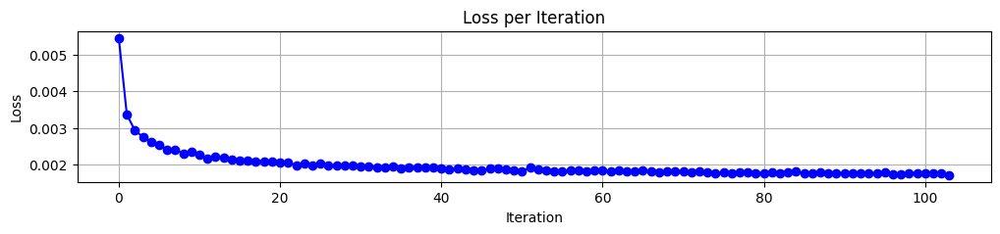

In [180]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

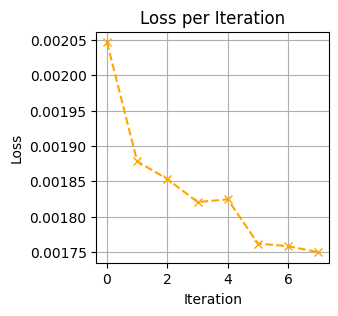

In [181]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

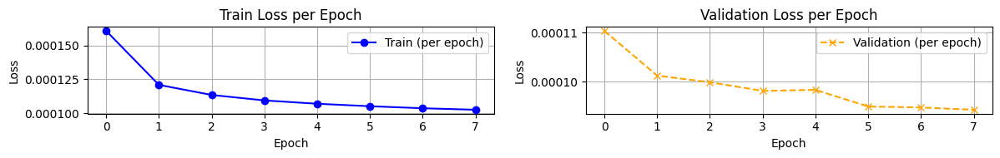

In [182]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

In [183]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [184]:
cluster_id = 2
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model_name = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}.pth'
model.load_state_dict(torch.load(model_name))

<All keys matched successfully>

In [185]:
test_path = f'/root/cluster/c{cluster_id}/test_dataset.pt'
test_dataset = torch.load(test_path)
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

293

In [186]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating: 100%|██████████| 293/293 [00:05<00:00, 55.76it/s]


In [187]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

def rescale(normalized_img, original_min=-1000, original_max=3000):
    """
    정규화된 이미지를 원래 HU 범위로 복원하는 함수

    :param normalized_img: 정규화된 이미지 (0~1)
    :param original_min: 원본 HU 최소값
    :param original_max: 원본 HU 최대값
    :return: 원래 HU 값으로 복원된 이미지
    """
    restored_img = normalized_img * (original_max - original_min) + original_min
    return restored_img

def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

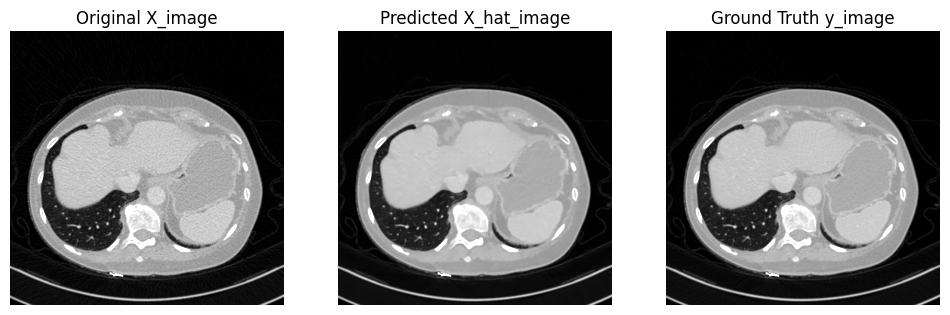

In [188]:
# 1. 가장 좋은 값 가져오기
X_test, y_test, X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'best')

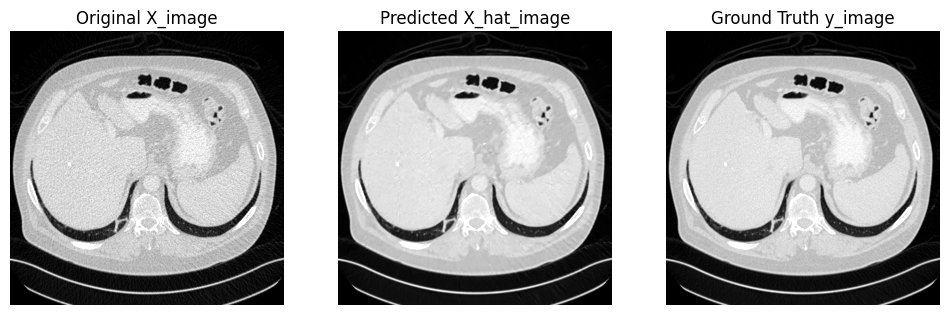

In [189]:
# 2. 가장 나쁜 값 가져오기
X_test, y_test, X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
img = trans_img(X_test)
p1, p99 = np.percentile(img, (1, 99))
axes[0].imshow(img, cmap='gray', vmin=p1, vmax=p99)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
img_hat = trans_img(X_hat)
p1_hat, p99_hat = np.percentile(img_hat, (1, 99))
axes[1].imshow(img_hat, cmap='gray', vmin=p1_hat, vmax=p99_hat)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
img_y = trans_img(y_test)
p1_y, p99_y = np.percentile(img_y, (1, 99))
axes[2].imshow(img_y, cmap='gray', vmin=p1_y, vmax=p99_y)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

# 이미지 저장
save_img(X_test, X_hat, y_test, 'worst')

In [190]:
# rmse, psnr, ssim 구하기

import torch
import torch.nn as nn
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from tqdm import tqdm

criterion = nn.MSELoss()
interval = 100

# 저장된 모델 로드
model_path = f'/root/cluster/c{cluster_id}/red_cnn_c{cluster_id}.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNN().to(device)
model.load_state_dict(torch.load(model_path))

# 평가 지표 계산 추가
def calculate_psnr(y_true, y_pred):
    """PSNR 계산 함수"""
    y_true = y_true.cpu().numpy()
    y_pred = y_pred.cpu().numpy()
    return peak_signal_noise_ratio(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

def calculate_ssim(y_true, y_pred):
    """SSIM 계산 함수"""
    y_true = y_true.squeeze(0).cpu().numpy()
    y_pred = y_pred.squeeze(0).cpu().numpy()
    return structural_similarity(y_true, y_pred, data_range=1.0)  # 정규화된 데이터라면 data_range=1.0

# evaluate 부분 + top10 best&worst
model.eval()
running_loss = 0.0
running_psnr = 0.0
running_ssim = 0.0
psnr_list = []
ssim_list = []
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        mse_loss = criterion(X_hat, y)

        # RMSE 계산
        rms_loss = torch.sqrt(mse_loss)
        running_loss += rms_loss.item()

        # PSNR, SSIM 계산
        for j in range(X.size(0)):  # 배치 내부 개별 이미지에 대해 계산
            psnr = calculate_psnr(y[j, :, :, :], X_hat[j, :, :, :])
            ssim = calculate_ssim(y[j, :, :, :], X_hat[j, :, :, :]) 
            running_psnr += psnr # batch에 대해 더해준다.
            running_ssim += ssim

        if mse_loss < best_loss:
            best_loss = mse_loss
            best = (X, y, X_hat)
        if mse_loss > worst_loss:
            worst_loss = mse_loss
            worst = (X, y, X_hat)

        if i % interval == interval - 1:
            interval_loss = running_loss / interval
            interval_psnr = running_psnr / (interval * X.size(0)) # batch에 대해 나눠준다
            interval_ssim = running_ssim / (interval * X.size(0))

            loss_list.append(interval_loss)
            psnr_list.append(interval_psnr)
            ssim_list.append(interval_ssim)

            total_loss += interval_loss
            running_loss = 0.0
            running_psnr = 0.0
            running_ssim = 0.0
            tqdm.write(f'RMSE per interval: {interval_loss:.4f}, PSNR per interval: {interval_psnr:.2f}, SSIM per interval: {interval_ssim:.4f}')
            # tqdm.write(f'RMSE per interval: {interval_loss}, PSNR per interval: {interval_psnr}, SSIM per interval: {interval_ssim}')

    # 평균 RMSE 출력
average_loss = total_loss / len(loss_list)
print(f"Average RMSE over all intervals: {average_loss:.6f}")

Evaluating:   1%|          | 3/293 [00:00<00:14, 20.21it/s]

Evaluating:  35%|███▍      | 102/293 [00:05<00:09, 20.41it/s]

RMSE per interval: 0.0103, PSNR per interval: 41.38, SSIM per interval: 0.9486


Evaluating:  70%|██████▉   | 204/293 [00:09<00:04, 20.38it/s]

RMSE per interval: 0.0111, PSNR per interval: 41.07, SSIM per interval: 0.9458


Evaluating: 100%|██████████| 293/293 [00:14<00:00, 20.41it/s]

Average RMSE over all intervals: 0.010669


In [191]:
import os
import numpy as np

s = f'/root/cluster/c{cluster_id}/metric/'

# 파일 저장 경로
file_names = {
    "loss": "loss_list.npy",
    "psnr": "psnr_list.npy",
    "ssim": "ssim_list.npy"
}

# 각 리스트를 저장
np.save(s+file_names["loss"], loss_list)
np.save(s+file_names["psnr"], psnr_list)
np.save(s+file_names["ssim"], ssim_list)

print(f"Lists have been saved in the {s} folder:\n- {file_names['loss']}\n- {file_names['psnr']}\n- {file_names['ssim']}")

Lists have been saved in the /root/cluster/c2/metric/ folder:
- loss_list.npy
- psnr_list.npy
- ssim_list.npy


# 모델 비교

In [192]:
!pwd

/root/cluster/c2


In [193]:
%cd /root

/root


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


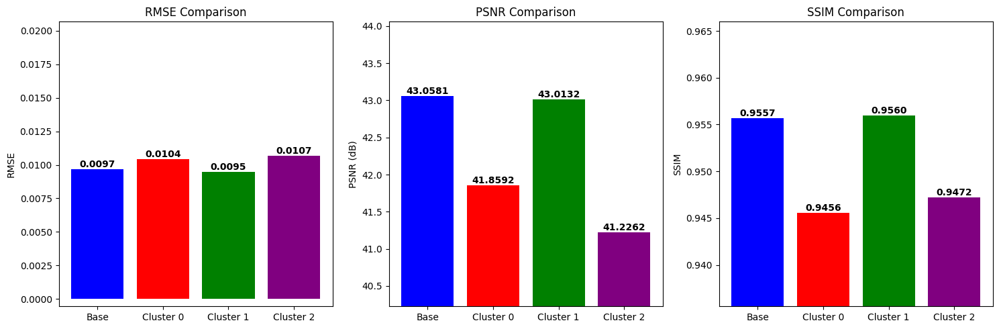

In [194]:
import numpy as np
import matplotlib.pyplot as plt

# 모델별 메트릭 파일 경로
metric_path_list = [
    '/root/base/metric',
    '/root/cluster/c0/metric',
    '/root/cluster/c1/metric',
    '/root/cluster/c2/metric'
]

# 파일 이름 리스트
file_name_list = ['loss_list.npy', 'psnr_list.npy', 'ssim_list.npy']

# 모델별 이름
model_names = ['Base', 'Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['blue', 'red', 'green', 'purple']

# RMSE, PSNR, SSIM 저장 리스트
rmse_list = []
psnr_list = []
ssim_list = []

# 각 모델의 메트릭 계산
for path in metric_path_list:
    rmse = np.mean(np.load(f'{path}/{file_name_list[0]}'))
    psnr = np.mean(np.load(f'{path}/{file_name_list[1]}'))
    ssim = np.mean(np.load(f'{path}/{file_name_list[2]}'))

    rmse_list.append(rmse)
    psnr_list.append(psnr)
    ssim_list.append(ssim)

# Y축 범위 설정 (차이를 두드러지게)
rmse_min, rmse_max = min(rmse_list) - 0.01, max(rmse_list) + 0.01
psnr_min, psnr_max = min(psnr_list) - 1, max(psnr_list) + 1
ssim_min, ssim_max = min(ssim_list) - 0.01, max(ssim_list) + 0.01

# 그래프 그리기
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# RMSE 비교 (낮을수록 좋음)
axes[0].bar(model_names, rmse_list, color=colors)
axes[0].set_title('RMSE Comparison')
axes[0].set_ylabel('RMSE')
axes[0].set_ylim(rmse_min, rmse_max)

# PSNR 비교 (높을수록 좋음)
axes[1].bar(model_names, psnr_list, color=colors)
axes[1].set_title('PSNR Comparison')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_ylim(psnr_min, psnr_max)

# SSIM 비교 (높을수록 좋음)
axes[2].bar(model_names, ssim_list, color=colors)
axes[2].set_title('SSIM Comparison')
axes[2].set_ylabel('SSIM')
axes[2].set_ylim(ssim_min, ssim_max)

# 막대 위에 수치 추가
for i, ax in enumerate(axes):
    for j, v in enumerate([rmse_list, psnr_list, ssim_list][i]):
        ax.text(j, v, f'{v:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()